In [1]:
# widen jupyter notebook window
from IPython.display import display, HTML
display(HTML("<style>.container {width:95% !important; }</style>"))

# check environment
import os
print(f'Conda Environment: ' + os.environ['CONDA_DEFAULT_ENV'])

from platform import python_version
print(f'python version: {python_version()}')

Conda Environment: ROICaT
python version: 3.9.13


In [2]:
import pprint
from pathlib import Path
import re

import natsort
import matplotlib.pyplot as plt
from tqdm import tqdm

In [3]:
%load_ext autoreload
%autoreload 2
import bnpm
import bnpm.server
import bnpm.plotting_helpers
import bnpm.file_helpers
import bnpm.path_helpers
import bnpm.indexing
import bnpm.timeSeries
import bnpm.decomposition

import bnpm.parallel_helpers

In [4]:
import itertools
import datetime

import scipy.io
import pandas as pd
import numpy as np
import matplotlib as mpl

In [5]:
mouse = 'mouse_1511L'
# cage = 'BMI_cage_1511_4'

In [6]:
# ## mouse_B

# dates_toUse = [
#     '20221021',
#     '20221022',
#     '20221023',
#     '20221024',
#     '20221025',
#     '20221026',
#     '20221028',
#     '20221029',
#     '20221030',
#     '20221031',
#     '20221101',
#     '20221102',
#     '20221103',
#     '20221104',
#     '20221105',
#     '20221106',
# ]

In [7]:
# ## mouse_g1

# dates_toUse = [
#     '20221011',
#     '20221013',
#     '20221014',
#     '20221015',
#     '20221016',
# ]

In [8]:
# ## mouse_2_6

# dates_toUse = [
#     '20210409',
#     '20210410',
#     '20210411',
#     '20210412',
#     '20210413',
#     '20210414',
#     '20210415',
#     '20210416',
#     '20210417',
# ]

In [9]:
## mouse_1511L

dates_toUse = [
#     '20230111',
    '20230112',
    '20230113',
    '20230114',
    '20230115',
    '20230116',
    '20230117',
    '20230118',
    '20230119',
]

In [10]:
Fs = 30

In [11]:
dir_save_data = f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}'

# Get files from server

input credentials for server

In [14]:
import getpass

remote_host_transfer = "transfer.rc.hms.harvard.edu"
remote_host_compute = "o2.hms.harvard.edu"
username = input('Username: ')
pw = bnpm.server.pw_encode(getpass.getpass(prompt='Password: '))

Username: rh183
Password: ········


prepare sftp client

In [15]:
ssh_t = bnpm.server.ssh_interface()

ssh_t.o2_connect(
    hostname=remote_host_transfer,
    username=username,
    password=bnpm.server.pw_decode(pw),
    skip_passcode=False,
    key_filename=None,
    look_for_keys=False,
    passcode_method=1,
    verbose=1,
)

sftp_t = bnpm.server.sftp_interface(ssh_t.client)

Duo two-factor login for rh183

Enter a passcode or select one of the following options:

 1. Duo Push to XXX-XXX-4151
 2. Phone call to XXX-XXX-4151
 3. SMS passcodes to XXX-XXX-4151

Passcode or option (1-3): 
1



Pushed a login request to your device...

Success. Logging you in...

Welcome to O2 (Orchestra 2)!

   ___    ____
  / _ \  |___ \
 | | | |   __) |
 | |_| |  / __/
  \___/  |_____|


You've landed on transfer06 which is a
4 core system with 7.64 GiB memory
running kernel 3.10.0 born on 2020-08-11

==== O2 ===================================================================

  News (Sep 8 2022)
  

  +-------------------------------------------------------------------------------+
  | ###################### Try out the new O2 Portal! ########################### |
  |                                                                               |
  | * Access O2 via the web! Just point your web browser to                       |
  |   o2portal.rc.hms.harvard.edu and login wit

### find logger files
Search for logger files and associated expParams files

In [91]:
paths_logger_raw = sftp_t.search_recursive(
#     path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{mouse}',
#     path=f'/n/data1/hms/neurobio/sabatini/rich/data/res2p/round_5_experiments/{mouse}/scanimage',
    path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{cage}/{mouse}',
    search_pattern_re='logger.mat',
    max_depth=5,
    find_files=True,
    find_folders=False,
    verbose=True,
)

/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230121/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230115/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230112/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230113/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230114/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230122/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230117/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230119/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230120/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_

In [49]:
# paths_logger = {Path(p).parent.parent.name: p for p in natsort.natsorted(paths_logger_raw)}  ## mouse_g1
paths_logger = {Path(p).parent.parent.name: p for p in natsort.natsorted(paths_logger_raw) if Path(p).parent.name == 'analysis_data'}  ## mouse_B
# paths_logger = {Path(p).parent.name: p for p in natsort.natsorted(paths_logger_raw)}  ## mouse 2_6
display(paths_logger)

{'20230119': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230119/analysis_data/logger.mat'}

In [50]:
paths_loggerAligned_raw = sftp_t.search_recursive(
#     path=f'/n/data1/hms/neurobio/sabatini/rich/analysis/logger_alignment/{mouse}',
#     path=f'/n/data1/hms/neurobio/sabatini/rich/data/res2p/round_5_experiments/{mouse}/scanimage',
    path=f'/n/data1/hms/neurobio/sabatini/gyu/analysis/BWAIN_output/{mouse}',
    search_pattern_re='logger_aligned.mat',
    max_depth=5,
    find_files=True,
    find_folders=False,
    verbose=True,
)

/n/data1/hms/neurobio/sabatini/gyu/analysis/BWAIN_output/mouse_1511L/20230119/analysis_data/logger_aligned.mat


In [51]:
# paths_loggerAligned = {Path(p).parent.name: p for p in natsort.natsorted(paths_loggerAligned_raw)}
paths_loggerAligned = {Path(p).parent.parent.name: p for p in natsort.natsorted(paths_loggerAligned_raw)}
display(paths_loggerAligned)

{'20230119': '/n/data1/hms/neurobio/sabatini/gyu/analysis/BWAIN_output/mouse_1511L/20230119/analysis_data/logger_aligned.mat'}

In [52]:
paths_logger_valsROIs_aligned_raw = sftp_t.search_recursive(
#     path=f'/n/data1/hms/neurobio/sabatini/rich/analysis/logger_alignment/{mouse}',
#     path=f'/n/data1/hms/neurobio/sabatini/rich/data/res2p/round_5_experiments/{mouse}/scanimage',
    path=f'/n/data1/hms/neurobio/sabatini/gyu/analysis/BWAIN_output/{mouse}',
    search_pattern_re='logger_valsROIs_aligned.mat',
    max_depth=5,
    find_files=True,
    find_folders=False,
    verbose=True,
)

/n/data1/hms/neurobio/sabatini/gyu/analysis/BWAIN_output/mouse_1511L/20230119/analysis_data/logger_valsROIs_aligned.mat


In [53]:
# paths_logger_valsROIs_aligned = {Path(p).parent.name: p for p in natsort.natsorted(paths_logger_valsROIs_aligned_raw)}
paths_logger_valsROIs_aligned = {Path(p).parent.parent.name: p for p in natsort.natsorted(paths_logger_valsROIs_aligned_raw)}
display(paths_logger_valsROIs_aligned)

{'20230119': '/n/data1/hms/neurobio/sabatini/gyu/analysis/BWAIN_output/mouse_1511L/20230119/analysis_data/logger_valsROIs_aligned.mat'}

In [16]:
paths_expParams_raw = sftp_t.search_recursive(
#     path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{mouse}',
#     path=f'/n/data1/hms/neurobio/sabatini/rich/data/res2p/round_5_experiments/{mouse}/scanimage',
    path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{cage}/{mouse}',
    search_pattern_re='expParams.mat',
    max_depth=5,
    find_files=True,
    find_folders=False,
    verbose=True,
)

/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230111/analysis_data/expParams.mat


In [17]:
paths_expParams = {Path(p).parent.parent.name: p for p in natsort.natsorted(paths_expParams_raw)}
# paths_expParams = {Path(p).parent.name: p for p in natsort.natsorted(paths_expParams_raw)}
display(paths_expParams)

{'20230111': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230111/analysis_data/expParams.mat'}

In [92]:
paths_stat_raw = sftp_t.search_recursive(
#     path=f'/n/data1/hms/neurobio/sabatini/rich/analysis/suite2p_output/{mouse}',
#     path=f'/n/data1/hms/neurobio/sabatini/rich/data/res2p/round_5_experiments/{mouse}/scanimage',
    path=f'/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/{mouse}',
    search_pattern_re='stat.npy',
    max_depth=7,
    find_files=True,
    find_folders=False,
    verbose=True,
)

/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230115/scanimage_data/baseline/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230115/scanimage_data/post/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230115/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230112/scanimage_data/baseline/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230112/scanimage_data/post/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230112/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230113/scanimage_data/baseline/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/

In [126]:
paths_stat_raw2 = natsort.natsorted([p for p in paths_stat_raw if '/exp/' in p])

In [127]:
# paths_stat = {Path(p).parent.parent.parent.parent.parent.parent.name: p for p in natsort.natsorted(paths_stat)}
# paths_stat = {Path(p).parent.parent.parent.parent.name: p for p in natsort.natsorted(paths_stat_raw)}
paths_stat = {re.search('\d{8}', p).group(): p for p in natsort.natsorted(paths_stat_raw2)}
display(paths_stat)

{'20230111': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230111/scanimage_data/exp/plane0/stat.npy',
 '20230112': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230112/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy',
 '20230113': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230113/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy',
 '20230114': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230114/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy',
 '20230115': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230115/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy',
 '20230116': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230116/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy',
 '20230117': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230117/scanimage_data/exp/jobNum_0/suite2p

In [128]:
paths_ops = {date: str(Path(p).parent / 'ops.npy') for date,p in paths_stat.items()}

In [129]:
paths_ops

{'20230111': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230111/scanimage_data/exp/plane0/ops.npy',
 '20230112': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230112/scanimage_data/exp/jobNum_0/suite2p/plane0/ops.npy',
 '20230113': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230113/scanimage_data/exp/jobNum_0/suite2p/plane0/ops.npy',
 '20230114': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230114/scanimage_data/exp/jobNum_0/suite2p/plane0/ops.npy',
 '20230115': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230115/scanimage_data/exp/jobNum_0/suite2p/plane0/ops.npy',
 '20230116': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230116/scanimage_data/exp/jobNum_0/suite2p/plane0/ops.npy',
 '20230117': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230117/scanimage_data/exp/jobNum_0/suite2p/plane

In [130]:
paths_F = {date: str(Path(p).parent / 'F.npy') for date,p in paths_stat.items()}

In [131]:
paths_F

{'20230111': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230111/scanimage_data/exp/plane0/F.npy',
 '20230112': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230112/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '20230113': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230113/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '20230114': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230114/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '20230115': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230115/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '20230116': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230116/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '20230117': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230117/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '

In [132]:
paths_Fneu = {date: str(Path(p).parent / 'Fneu.npy') for date,p in paths_stat.items()}

In [133]:
paths_Fneu

{'20230111': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230111/scanimage_data/exp/plane0/Fneu.npy',
 '20230112': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230112/scanimage_data/exp/jobNum_0/suite2p/plane0/Fneu.npy',
 '20230113': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230113/scanimage_data/exp/jobNum_0/suite2p/plane0/Fneu.npy',
 '20230114': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230114/scanimage_data/exp/jobNum_0/suite2p/plane0/Fneu.npy',
 '20230115': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230115/scanimage_data/exp/jobNum_0/suite2p/plane0/Fneu.npy',
 '20230116': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230116/scanimage_data/exp/jobNum_0/suite2p/plane0/Fneu.npy',
 '20230117': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230117/scanimage_data/exp/jobNum_0/suite2p

In [134]:
paths_spks = {date: str(Path(p).parent / 'spks.npy') for date,p in paths_stat.items()}

In [135]:
paths_spks

{'20230111': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230111/scanimage_data/exp/plane0/spks.npy',
 '20230112': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230112/scanimage_data/exp/jobNum_0/suite2p/plane0/spks.npy',
 '20230113': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230113/scanimage_data/exp/jobNum_0/suite2p/plane0/spks.npy',
 '20230114': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230114/scanimage_data/exp/jobNum_0/suite2p/plane0/spks.npy',
 '20230115': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230115/scanimage_data/exp/jobNum_0/suite2p/plane0/spks.npy',
 '20230116': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230116/scanimage_data/exp/jobNum_0/suite2p/plane0/spks.npy',
 '20230117': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_1511L/20230117/scanimage_data/exp/jobNum_0/suite2p

In [136]:
assert all([sftp_t.exists(p) for date,p in paths_ops.items()])

In [137]:
paths_local_tmp = [str(Path(dir_save_data) / 'statFiles' / d) for d,_ in paths_stat.items()]
[Path(p).mkdir(parents=True, exist_ok=True) for p in paths_local_tmp];

In [138]:
[sftp_t.sftp.get(
    remotepath=p_r,
    localpath=str(Path(p_l) / 'stat.npy'),
) for (date, p_r), p_l in tqdm(zip(paths_stat.items(), paths_local_tmp))];

10it [01:04,  6.43s/it]


In [139]:
[sftp_t.sftp.get(
    remotepath=p_r,
    localpath=str(Path(p_l) / 'ops.npy'),
) for (date, p_r), p_l in tqdm(zip(paths_ops.items(), paths_local_tmp))];

10it [07:53, 47.32s/it]


In [140]:
[sftp_t.sftp.get(
    remotepath=p_r,
    localpath=str(Path(p_l) / 'F.npy'),
) for (date, p_r), p_l in tqdm(zip(paths_F.items(), paths_local_tmp))];

10it [54:54, 329.41s/it]


In [141]:
[sftp_t.sftp.get(
    remotepath=p_r,
    localpath=str(Path(p_l) / 'Fneu.npy'),
) for (date, p_r), p_l in tqdm(zip(paths_Fneu.items(), paths_local_tmp))];

10it [55:46, 334.62s/it]


In [142]:
[sftp_t.sftp.get(
    remotepath=p_r,
    localpath=str(Path(p_l) / 'spks.npy'),
) for (date, p_r), p_l in tqdm(zip(paths_spks.items(), paths_local_tmp))];

10it [54:44, 328.48s/it]


### subselect dates to use

In [54]:
paths_loggerAligned = {key: val for key, val in paths_loggerAligned.items() if key in dates_toUse}
paths_logger_valsROIs_aligned = {key: val for key, val in paths_logger_valsROIs_aligned.items() if key in dates_toUse}
paths_logger = {key: val for key, val in paths_logger.items() if key in dates_toUse}
paths_expParams = {key: val for key, val in paths_expParams.items() if key in dates_toUse}

### get logger and expParams files
Pull them into a temp directory structure

make a directory structure based on the naming of the directories in remote.\
Might need to add or remove `.parent` suffices to `Path(p).resolve().parent`

In [55]:
folderNames_session = [str(p) for p in paths_logger.keys()]
dirs_save_session = [str(Path(dir_save_data).resolve() / 'loggers'/ n) for n in folderNames_session]

check to make sure these are the dated session folder names

In [56]:
display(folderNames_session)

['20230119']

In [57]:
paths_loggerAligned

{'20230119': '/n/data1/hms/neurobio/sabatini/gyu/analysis/BWAIN_output/mouse_1511L/20230119/analysis_data/logger_aligned.mat'}

In [58]:
paths_logger_valsROIs_aligned

{'20230119': '/n/data1/hms/neurobio/sabatini/gyu/analysis/BWAIN_output/mouse_1511L/20230119/analysis_data/logger_valsROIs_aligned.mat'}

In [59]:
paths_expParams

{'20230111': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230111/analysis_data/expParams.mat'}

In [60]:
paths_loggerAligned

{'20230119': '/n/data1/hms/neurobio/sabatini/gyu/analysis/BWAIN_output/mouse_1511L/20230119/analysis_data/logger_aligned.mat'}

In [62]:
## Make directories
[Path(d).mkdir(parents=True, exist_ok=True) for d in dirs_save_session];

## Enumerate paths for each session
paths_transfer = {folderName: {
    'path_loggerAligned_remote': paths_loggerAligned[folderName], 
    'path_loggerAligned_local': str(Path(dirs_save_session[i_folder]) / 'logger_aligned.mat'),
    'path_loggerValsAligned_remote': paths_logger_valsROIs_aligned[folderName], 
    'path_loggerValsAligned_local': str(Path(dirs_save_session[i_folder]) / 'logger_valsROIs_aligned.mat'),
    'path_logger_remote': paths_logger[folderName], 
    'path_logger_local': str(Path(dirs_save_session[i_folder]) / 'logger.mat'),
    'path_expParams_remote': paths_expParams[folderName],
    'path_expParams_local': str(Path(dirs_save_session[i_folder]) / 'expParams.mat'),
#     'path_loggerAlignmentVectors_remote': paths_loggerAlignmentVectors[i_folder],
#     'path_loggerAlignmentVectors_local': str(Path(dirs_save_session[i_folder]) / 'logger_alignment_vectors.mat'),
#     'path_loggerAligned_remote': paths_loggerAligned[i_folder],
#     'path_loggerAligned_local': str(Path(dirs_save_session[i_folder]) / 'logger_aligned.mat'),
} for i_folder, folderName in enumerate(folderNames_session)}

In [ ]:
for folderName, paths in tqdm(paths_transfer.items()):
    sftp_t.sftp.get(remotepath=paths['path_loggerAligned_remote'], localpath=paths['path_loggerAligned_local'])
    sftp_t.sftp.get(remotepath=paths['path_loggerValsAligned_remote'], localpath=paths['path_loggerValsAligned_local'])
    sftp_t.sftp.get(remotepath=paths['path_logger_remote'], localpath=paths['path_logger_local'])
    sftp_t.sftp.get(remotepath=paths['path_expParams_remote'], localpath=paths['path_expParams_local'])
#     sftp_t.sftp.get(remotepath=paths['path_loggerAlignmentVectors_remote'], localpath=paths['path_loggerAlignmentVectors_local'])
#     sftp_t.sftp.get(remotepath=paths['path_loggerAligned_remote'], localpath=paths['path_loggerAligned_local'])

download ROICaT output

In [61]:
path_save = str(Path(dir_save_data).resolve() / 'roicat.pkl')

sftp_t.sftp.get(
    remotepath=f'/n/data1/hms/neurobio/sabatini/rich/analysis/ROI_tracking/{mouse}/{mouse}.ROICaT.results.pkl',
    localpath=path_save,
)

download `iscell_NN_tqm.npy`

In [293]:
sftp_t.search_recursive(
    path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{cage}/{mouse}',
    search_pattern_re='iscell',
    max_depth=7
)

/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230111/analysis_data/iscell_NN.npy
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230111/analysis_data/suite2p/plane0/iscell.npy
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230111/analysis_data/iscell_NN_tqm.npy


['/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230111/analysis_data/iscell_NN.npy',
 '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230111/analysis_data/suite2p/plane0/iscell.npy',
 '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230111/analysis_data/iscell_NN_tqm.npy']

In [294]:
path_save = str(Path(dir_save_data).resolve() / 'iscell_NN_tqm.npy')

sftp_t.sftp.get(
    remotepath=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/BMI_cage_1511_4/mouse_1511L/20230111/analysis_data/iscell_NN_tqm.npy',
    localpath=path_save,
)

download spike_prob

In [215]:
paths_spikeProb = sftp_t.search_recursive(
    path=f'/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/{mouse}',
    search_pattern_re='spike_prob',
    max_depth=12,
    find_files=True,
    find_folders=False,
    verbose=True,
)

/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230115/jobNum_0/spike_prob.npy
/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230112/jobNum_0/spike_prob.npy
/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230113/jobNum_0/spike_prob.npy
/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230114/jobNum_0/spike_prob.npy
/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230117/jobNum_0/spike_prob.npy
/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230119/jobNum_0/spike_prob.npy
/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230111/jobNum_0/spike_prob.npy
/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230118/jobNum_0/spike_prob.npy
/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230116/jobNum_0/spike_prob.npy


In [216]:
paths_spikeProb = natsort.natsorted(paths_spikeProb)
paths_spikeProb

['/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230111/jobNum_0/spike_prob.npy',
 '/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230112/jobNum_0/spike_prob.npy',
 '/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230113/jobNum_0/spike_prob.npy',
 '/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230114/jobNum_0/spike_prob.npy',
 '/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230115/jobNum_0/spike_prob.npy',
 '/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230116/jobNum_0/spike_prob.npy',
 '/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230117/jobNum_0/spike_prob.npy',
 '/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230118/jobNum_0/spike_prob.npy',
 '/n/data1/hms/neurobio/sabatini/rich/analysis/spike_inference/mouse_1511L/20230119/jobNum_0/spike_prob.npy']

In [219]:
paths_save = []
dates = []
for i_file, path in enumerate(paths_spikeProb):
    date = Path(path).resolve().parent.parent.name
#     date = dates_toUse[i_file]
    print(f'date: {date}')
    dates.append(date)
    path_save = str(Path(dir_save_data).resolve() / 'spike_prob' / f'{date}_spikeProb.npy')
    paths_save.append(path_save)
    Path(path_save).parent.mkdir(parents=True, exist_ok=True)
    sftp_t.sftp.get(
        remotepath=path,
        localpath=path_save,
    )

date: 20230119


# Import Data from local

### logger and expParams

make lists of logger dicts and expParams dicts

In [12]:
# logger_objs    = {folderName: scipy.io.loadmat(file_name=p, simplify_cells=True)['logger']    for folderName,p in {folderName: pt['path_logger_local']    for folderName,pt in paths_transfer.items()}.items()}
# loggerAligned_objs    = {folderName: scipy.io.loadmat(file_name=p, simplify_cells=True)['logger_aligned']    for folderName,p in {folderName: pt['path_loggerAligned_local']    for folderName,pt in paths_transfer.items()}.items()}
# expParams_objs = {folderName: scipy.io.loadmat(file_name=p, simplify_cells=True)['expParams'] for folderName,p in {folderName: pt['path_expParams_local'] for folderName,pt in paths_transfer.items()}.items()}
# # loggerAlignmentVectors_objs = [scipy.io.loadmat(file_name=p, simplify_cells=True)['logger_alignment_vectors'] for p in [pt['path_loggerAlignmentVectors_local'] for folderName,pt in paths_transfer.items()]]
# # loggerAligned_objs = [scipy.io.loadmat(file_name=p, simplify_cells=True)['logger_aligned'] for p in [pt['path_loggerAligned_local'] for folderName,pt in paths_transfer.items()]]

In [13]:
paths_local_logger = bnpm.path_helpers.find_paths(
    dir_outer=f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}/loggers/',
    reMatch='logger.mat',
    depth=2
)
paths_local_logger = [p for p in paths_local_logger if Path(p).parent.name in dates_toUse]
display(paths_local_logger)


load_logger = lambda path: {Path(path).parent.name: scipy.io.loadmat(file_name=path, simplify_cells=True)['logger']}

logger_objs = {}
[logger_objs.update(load_logger(path)) for path in tqdm(paths_local_logger)];

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230112/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230113/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230114/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230115/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230116/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230117/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230118/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230119/logger.mat']

100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 10.20it/s]


In [14]:
paths_local_loggerAligned = bnpm.path_helpers.find_paths(
    dir_outer=f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}/loggers/',
    reMatch='logger_aligned.mat',
    depth=2
)
paths_local_loggerAligned = [p for p in paths_local_loggerAligned if Path(p).parent.name in dates_toUse]
display(paths_local_loggerAligned)

load_loggerAligned = lambda path: {Path(path).parent.name: scipy.io.loadmat(file_name=path, simplify_cells=True)['logger_aligned']}

loggerAligned_objs = {}
[loggerAligned_objs.update(load_loggerAligned(path)) for path in tqdm(paths_local_loggerAligned)];

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230112/logger_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230113/logger_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230114/logger_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230115/logger_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230116/logger_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230117/logger_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230118/logger_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230119/logger_aligned.mat']

100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 10.21it/s]


In [15]:
paths_local_loggerValsAligned = bnpm.path_helpers.find_paths(
    dir_outer=f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}/loggers/',
    reMatch='logger_valsROIs_aligned.mat',
    depth=2
)
paths_local_loggerValsAligned = [p for p in paths_local_loggerValsAligned if Path(p).parent.name in dates_toUse]
display(paths_local_loggerValsAligned)

load_loggerValsAligned = lambda path: {Path(path).parent.name: scipy.io.loadmat(file_name=path, simplify_cells=True)['logger_valsROIs_aligned']}

loggerValsAligned_objs = {}
[loggerValsAligned_objs.update(load_loggerValsAligned(path)) for path in tqdm(paths_local_loggerValsAligned)];
# bnpm.parallel_helpers.map_parallel(lambda p: loggerValsAligned_objs.update(load_loggerValsAligned(p)), paths_local_loggerValsAligned, method='serial');

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230112/logger_valsROIs_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230113/logger_valsROIs_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230114/logger_valsROIs_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230115/logger_valsROIs_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230116/logger_valsROIs_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230117/logger_valsROIs_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230118/logger_valsROIs_aligned.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230119/logger_valsROIs_aligned.mat']

100%|█████████████████████████████████████████████| 8/8 [00:21<00:00,  2.65s/it]


In [16]:
paths_local_expParams = bnpm.path_helpers.find_paths(
    dir_outer=f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}/loggers/',
    reMatch='expParams.mat',
    depth=2
)
paths_local_expParams = [p for p in paths_local_expParams if Path(p).parent.name in dates_toUse]
display(paths_local_expParams)

load_expParams = lambda path: {Path(path).parent.name: scipy.io.loadmat(file_name=path, simplify_cells=True)['expParams']}

expParams_objs = {}
[expParams_objs.update(load_expParams(path)) for path in paths_local_expParams];

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230112/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230113/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230114/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230115/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230116/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230117/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230118/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/loggers/20230119/expParams.mat']

## Import F and Fneu

In [18]:
paths_local_expParams = bnpm.path_helpers.find_paths(
    dir_outer=f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}/statFiles/',
    reMatch='F.npy',
    depth=2
)
paths_local_F = [p for p in paths_local_expParams if Path(p).parent.name in dates_toUse]
display(paths_local_F)

F_objs = {}
def loader(path):
    F_objs.update({Path(path).parent.name: np.load(path)})
[F_objs.update({Path(path).parent.name: np.load(path)}) for path in tqdm(paths_local_F)];
# bnpm.parallel_helpers.map_parallel(loader, paths_local_F, method='mpire');

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230112/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230113/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230114/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230115/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230116/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230117/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230118/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230119/F.npy']

100%|█████████████████████████████████████████████| 8/8 [00:25<00:00,  3.14s/it]


In [19]:
paths_local_expParams = bnpm.path_helpers.find_paths(
    dir_outer=f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}/statFiles/',
    reMatch='Fneu.npy',
    depth=2
)
paths_local_Fneu = [p for p in paths_local_expParams if Path(p).parent.name in dates_toUse]
display(paths_local_Fneu)


Fneu_objs = {}
def loader(path):
    Fneu_objs.update({Path(path).parent.name: np.load(path)})
[Fneu_objs.update({Path(path).parent.name: np.load(path)}) for path in tqdm(paths_local_Fneu)];
# bnpm.parallel_helpers.map_parallel(loader, paths_local_Fneu, method='multiprocessing');

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230112/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230113/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230114/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230115/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230116/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230117/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230118/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/statFiles/20230119/Fneu.npy']

100%|█████████████████████████████████████████████| 8/8 [00:24<00:00,  3.10s/it]


make dataframes for each logger using the loggerNames field from expParams

### WARNING:

in the line:
```
...
            data=logger[key_outer][:, :len(expParams['loggerNames'][key_outer])], 
...            
```
the indexing: `[:, :len(expParams['loggerNames'][key_outer])]` is used because the length of the logger is sometimes too long. This should be fine for most experiments, but just a heads up that if the `expParams['loggerNames']` and actual logger data doesn't match up then this is screwed.

In [17]:
logger_dfs = {
    date: {
        key_outer: pd.DataFrame(
            data=logger_objs[date][key_outer][:, :len(expParams_objs[date]['loggerNames'][key_outer])], 
            columns=expParams_objs[date]['loggerNames'][key_outer],
        ) for key_outer in expParams_objs[date]['loggerNames'].keys()
    } for date in expParams_objs.keys()
}

Drop th 'trials' field into the loggerAligned objects from the logger objects

In [18]:
[loggerAligned_objs[date].update({'trials': logger_objs[date]['trials']}) for date in loggerAligned_objs.keys()];

In [19]:
loggerAligned_dfs = {
    date: {
        key_outer: pd.DataFrame(
            data=loggerAligned_objs[date][key_outer][:, :len(expParams_objs[date]['loggerNames'][key_outer])], 
            columns=expParams_objs[date]['loggerNames'][key_outer],
        ) for key_outer in expParams_objs[date]['loggerNames'].keys()
    } for date in expParams_objs.keys()
}

Determine the duration of each trial.\
Note that the `'trial_now_'` fields appear to be busted. So it is safter to use the `'counter_frameNum_'` fields and just make sure to correct them using the alignment vectors.

To align raw logger indices to scanimage/suite2p indices, use the `logger_alignment_vectors` file and the `inds_align_movie_to_logger` field within it. You can use the `bnpm.indexing.index_with_nans` function to reindex a raw logger time series as such: 
```
ts_SI = bnpm.indexing.index_with_nans(
    values=ts_logger,
    indices=logger_alignment_vectors['inds_align_movie_to_logger']-1
)
```

To convert index values from logger indices to scanimage/suite2p indices, use the `inds_align_logger2movie` field. You can also use it with the `index_with_nans` function as such:
```
frame_start_SI = bnpm.indexing.index_with_nans(
        values=logger_alignment_vectors['inds_align_logger2movie'],
        indices=frame_start_logger,
    )

Also note that loggers BEFORE 2022.12.13 have a bug that appears in failure trials that occur after failure trials. Their duration will appear negative. This is because the update trial info happens after iterating the trial number instead of before:
```
trialNum = trialNum + 1
updateLoggerTrials_END(0)
```

## make `loggerVals_rollZ`

In [20]:
def zscore_rolling(X, wlen=100, axis=0, X_denom=None):
    X_df = pd.DataFrame(X)
    kwargs = {'min_periods': 1, 'center': False, 'win_type': None, 'closed': None}
    if X_denom is not None:
        X_std = pd.DataFrame(X_denom).rolling(wlen, axis=axis, **kwargs).std(ddof=0).to_numpy()
    else:
        X_std = X_df.rolling(wlen, axis=axis, **kwargs).std(ddof=0).to_numpy()
    X_std[X_std < 0.01] = np.inf
    return X_df.sub(X_df.rolling(wlen, axis=axis, **kwargs).mean()).div(X_std).to_numpy().astype(np.float32)


In [21]:
wlen = Fs * 60 * 15

# loggerVals_rollZ = {date: zscore_rolling(l, wlen=wlen).T for date,l in tqdm(loggerValsAligned_objs.items())}
loggerVals_rollZ = {}
def func_tmp(date_l):
    date, l = date_l
    return loggerVals_rollZ.update({date: zscore_rolling(l, wlen=wlen).T})
bnpm.parallel_helpers.map_parallel(func_tmp, [loggerValsAligned_objs.items()], method='multithreading');

100%|█████████████████████████████████████████████| 8/8 [00:06<00:00,  1.21it/s]


In [22]:
# d_test = expParams_objs['20221030']['baselineStuff']['ROIs']['cellWeightings']

# %matplotlib notebook
# plt.figure()
# plt.plot(loggerVals_rollZ['20221030'].T @ d_test)
# # plt.plot(test)
# plt.plot(loggerAligned_dfs['20221030']['decoder']['cursor_brain_raw'])


### Extract trial statistics

In [23]:
n_sessions = len(logger_dfs)

trials_duration_frame = []
trials_duration_nowTime = []
trials_success = []
trials_type_111 = []

for logger_df in logger_dfs.values():
    ## pull out frames of start and end. -1 to account for matlab 1-indexing
    frame_start__idx_logger = logger_df['trials']['counter_frameNum_trialStart'].to_numpy() - 1
    frame_end__idx_logger = logger_df['trials']['counter_frameNum_trialEnd'].to_numpy() - 1   
#     frame_start__idx_SI = bnpm.indexing.index_with_nans(
#         values=align['inds_align_logger2movie'],
#         indices=frame_start__idx_logger,
#     )
#     frame_end__idx_SI = bnpm.indexing.index_with_nans(
#         values=align['inds_align_logger2movie'],
#         indices=frame_end__idx_logger,
#     )
#     trials_duration_frame.append((frame_end__idx_SI - frame_start__idx_SI))
    
    ## pull out durations using time
    time_start__idx_logger = logger_df['trials']['time_now_trialStart'].to_numpy()
    time_end__idx_logger = logger_df['trials']['time_now_trialEnd'].to_numpy()
    trials_duration_nowTime.append((time_end__idx_logger - time_start__idx_logger))

    ## pull out whether the outcome was a success
    trials_success.append(logger_df['trials']['success_outcome'] == 1)
    
    ## pull out whether the trial type was a standard trial with feedback, reward, and cursor all one (1 1 1)
    trials_type_111.append((logger_df['trials']['trialType_cursorOn'] == 1) * (logger_df['trials']['trialType_feedbackLinked'] == 1) * (logger_df['trials']['trialType_rewardOn'] == 1))
    

Plot number of successful trials over sessions

In [24]:
trials_numSuccess__111 = [np.nansum(trials_success[ii][trials_type_111[ii]]) for ii in range(n_sessions)]

Text(0.5, 1.0, 'rewards total')

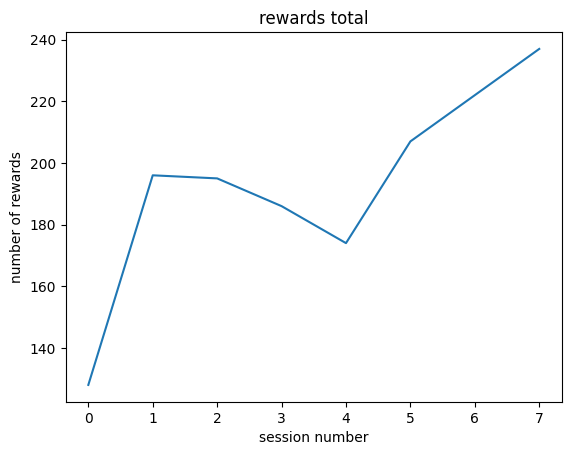

In [25]:
plt.figure()
plt.plot(trials_numSuccess__111)
plt.xlabel('session number')
plt.ylabel('number of rewards');
plt.title('rewards total')

Plot duration of successful trials over sessions as a histogram

In [26]:
trials_duration_time__success_111 = [trials_duration_nowTime[sn][trials_success[sn] * trials_type_111[sn]] * 24*60*60 for sn in range(len(trials_duration_nowTime))]

edges = np.linspace(0,20, num=41, endpoint=True)
trials_durationHist_time__success_111 = np.array([np.histogram(t, bins=edges)[0] for t in trials_duration_time__success_111]).T

<IPython.core.display.Javascript object>


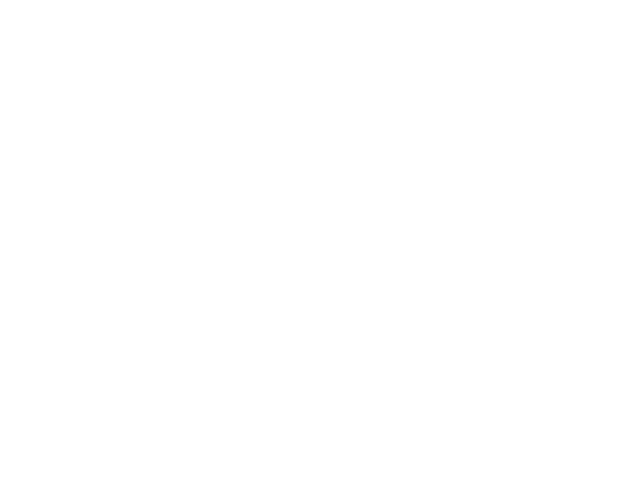

In [27]:
%matplotlib notebook

cmap = bnpm.plotting_helpers.simple_cmap(colors=[[0.0, 0.0, 1.0], [0.0, 0.75, 0.75], [0.0, 0.7, 0.0], [0.75, 0.75, 0], [0.85, 0.0, 0.0]])

plt.figure()
for ii,trace in enumerate(trials_durationHist_time__success_111.T):
    plt.plot(
        (edges[1:] +edges[:-1])/2, 
        trace, 
        color=cmap(ii/(n_sessions-1)), 
        linewidth=4,
        alpha=0.6,
    )
    
# [plt.stairs(t[0], t[1], color=colors[ii], linewidth=4) for ii,t in enumerate(trials_durationHist_time__success_111)];
plt.xlabel('duration trial (s) [successes]')
plt.ylabel('counts')
plt.title('number of rewards across trials')
plt.legend([f'session_{ii}' for ii in np.arange(n_sessions)+1])
ax = plt.gca()
plt.colorbar(mpl.cm.ScalarMappable(cmap=cmap), ax=ax);

<IPython.core.display.Javascript object>


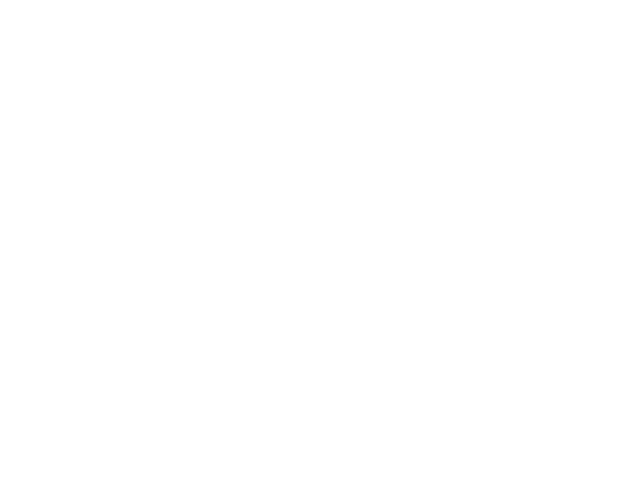

Text(0.5, 1.0, 'rewards within first 2.5 s')

In [28]:
plt.figure()
plt.plot(trials_durationHist_time__success_111[:5,:].sum(0))
plt.xlabel('session number')
plt.ylabel('successes (within 2.5 sec)')
plt.title('rewards within first 2.5 s')

### NOTE:

In earlier experiments use `CE_ITI_successful` and in later experiments use `CE_ITI_withZ`

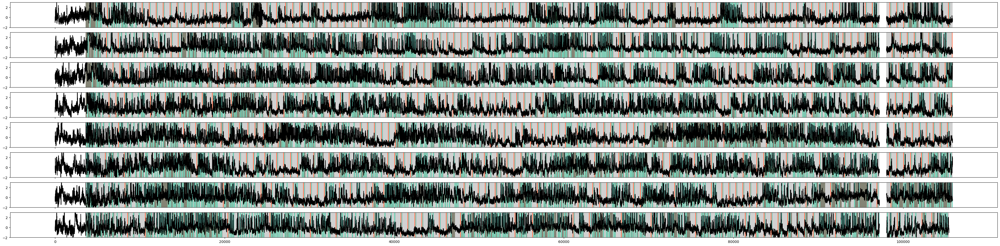

In [31]:
%matplotlib inline

fig, axs = plt.subplots(n_sessions, 1, sharex=True, figsize=(50, n_sessions*1.5))

for i_sesh,date in enumerate(expParams_objs.keys()):

    names_states = expParams_objs[date]['loggerNames']['timeSeries']

    names_toPlot = [
        'CE_trial',
        'CE_rewardToneHold',
        'CE_rewardDelivery',
        'CE_ITI_withZ',
        'CE_waitForBaseline',
        'CE_timeout'
    ]
    idx_toPlot = np.isin(names_states, names_toPlot)

    n_samples = logger_objs[date]['timeSeries'].shape[0]

    colors = {
        'CE_trial': (0.7, 0.7, 0.7),
        'CE_rewardToneHold': (0.0, 0.7, 0.0),
        'CE_rewardDelivery': (0.0, 0.7, 0.2),
        'CE_ITI_withZ': (0.0, 0.7, 0.6),
        'CE_waitForBaseline': (0.2, 0.2, 0.1),
        'CE_timeout': (1.0, 0.2, 0.0),
    }

    assert all([n_c == n_tp for n_c, n_tp in zip(list(colors.keys()), names_toPlot)])

    for name in names_toPlot:
        axs[i_sesh].fill_between(
            x=np.arange(n_samples),
            y1=logger_objs[date]['timeSeries'][:, np.isin(names_states, name)][:,0] * 10 - 5,
            y2=-5,
            alpha=0.6,
            color=colors[name],
            linewidth=0
        )
    axs[i_sesh].plot(logger_objs[date]['decoder'][:, expParams_objs[date]['loggerNames']['decoder'] == 'cursor_brain'], 'k')
    axs[i_sesh].set_ylim(-2,3)

## Analyze alignment

In [29]:
dir_save_data

'/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L'

In [30]:
path_roicat = bnpm.path_helpers.find_paths(dir_save_data, reMatch='ROICaT')[0]
display(path_roicat)
roicat_out = bnpm.file_helpers.pickle_load(path_roicat)

'/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/mouse_1511L.ROICaT.tracking.results.pkl'

In [31]:
len(roicat_out['UCIDs_bySession'])

10

In [32]:
# path_iscell = str(Path(dir_save_data).resolve() / 'iscell_NN_tqm.npy')
path_iscell = bnpm.path_helpers.find_paths(dir_save_data, reMatch='weights_day0')[0]
# iscell = np.load(path_iscell, allow_pickle=True)
iscell = np.load(path_iscell, allow_pickle=True)[()]['iscell_custom']

## import spike_prob

In [876]:
paths_spikeProb = bnpm.path_helpers.find_paths(
    dir_outer=dir_save_data,
    reMatch='spike_prob',
    depth=3,
)
paths_spikeProb

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/spike_prob/20230111_spikeProb.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/spike_prob/20230112_spikeProb.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/spike_prob/20230113_spikeProb.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/spike_prob/20230114_spikeProb.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/spike_prob/20230115_spikeProb.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/spike_prob/20230116_spikeProb.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/spike_prob/20230117_spikeProb.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/spike_prob/20230118_spikeProb.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/spike_prob/20230119_spikeProb.npy']

In [877]:
# sp_raw = {Path(p).name[:8]: np.load(p).astype(np.float32) for p in tqdm(paths_spikeProb)}

sp_raw = {}
def func_tmp(path):
    sp_raw.update({Path(path).name[:8]: np.load(path).astype(np.float32)})
bnpm.parallel_helpers.map_parallel(func_tmp, [paths_spikeProb], method='multithreading');

100%|█████████████████████████████████████████████| 9/9 [00:39<00:00,  4.35s/it]


In [37]:
[len(l) for l in roicat_out['UCIDs_bySession']]

[3608, 3360, 3751, 3734, 3765, 3853, 3960, 4148, 3949, 4005]

In [38]:
ucids_decoderVector = roicat_out['UCIDs_bySession'][0][iscell]

In [39]:
# ucids_decoderVector = roicat_out['UCIDs_bySession'][0]

In [40]:
len(roicat_out['UCIDs_bySession'])

10

In [314]:
assert len(sp_raw) == len(roicat_out['UCIDs_bySession']), f'Warning: number of spike_prob arrays is different from the number of ucids arrays'

AssertionError: Warning: number of spike_prob arrays is different from the number of ucids arrays

In [41]:
## find indices in each session that match with UCID in the ucids_decoderVector array
### the (val>=0) bit is to make sure the -1 values are excluded

dates_roicat = [Path(p).parent.name for p in roicat_out['input_data']['paths_stat']]

idx_matching_decoderVector_raw = {date: [np.where((sesh == val) * (val>=0))[0] for val in ucids_decoderVector] for date,sesh in tqdm(zip(dates_roicat, roicat_out['UCIDs_bySession']))};

10it [00:00, 170.14it/s]


In [42]:
## turn into list of arrays
idx_matching_decoderVector = {date: np.array([val[0] if len(val)==1 else -1 for val in arr], dtype=np.int64) for date, arr in idx_matching_decoderVector_raw.items()}

In [43]:
## check to make sure there aren't any duplicates
assert all([all([len(idx)<=1 for idx in idx_raw]) for idx_raw in idx_matching_decoderVector_raw])

In [44]:
rois_matched = [rois[idx] for rois,idx in zip(roicat_out['ROIs']['ROIs_aligned'], idx_matching_decoderVector.values())]

In [45]:
import bnpm.ca2p_preprocessing

In [46]:
import torch

In [853]:
dFoF = {date: bnpm.ca2p_preprocessing.make_dFoF(
    F=F,
    Fneu=Fneu,
    neuropil_fraction=0.7,
    percentile_baseline=20,
    channelOffset_correction=200,
    multicore_pref=True,
    verbose=True,
)[0] for (date,F),(date,Fneu) in zip(F_objs.items(), Fneu_objs.items())}

Calculated dFoF. Total elapsed time: 8.58 seconds
Calculated dFoF. Total elapsed time: 1.1 seconds
Calculated dFoF. Total elapsed time: 1.08 seconds
Calculated dFoF. Total elapsed time: 1.12 seconds
Calculated dFoF. Total elapsed time: 1.16 seconds
Calculated dFoF. Total elapsed time: 1.22 seconds
Calculated dFoF. Total elapsed time: 1.23 seconds
Calculated dFoF. Total elapsed time: 1.2 seconds


In [93]:
dFoF_F = {date: bnpm.ca2p_preprocessing.make_dFoF(
    F=F,
    Fneu=0,
    neuropil_fraction=0.7,
    percentile_baseline=20,
    channelOffset_correction=200,
    multicore_pref=True,
    verbose=True,
)[0] for (date,F),(date,Fneu) in zip(F_objs.items(), Fneu_objs.items())}

Calculated dFoF. Total elapsed time: 2.52 seconds
Calculated dFoF. Total elapsed time: 0.89 seconds
Calculated dFoF. Total elapsed time: 0.88 seconds
Calculated dFoF. Total elapsed time: 0.92 seconds
Calculated dFoF. Total elapsed time: 0.93 seconds
Calculated dFoF. Total elapsed time: 0.94 seconds
Calculated dFoF. Total elapsed time: 0.98 seconds
Calculated dFoF. Total elapsed time: 0.93 seconds


In [94]:
dFoF_Fneu = {date: bnpm.ca2p_preprocessing.make_dFoF(
    F=Fneu,
    Fneu=0,
    neuropil_fraction=0.7,
    percentile_baseline=20,
    channelOffset_correction=200,
    multicore_pref=True,
    verbose=True,
)[0] for (date,F),(date,Fneu) in zip(F_objs.items(), Fneu_objs.items())}

Calculated dFoF. Total elapsed time: 0.79 seconds
Calculated dFoF. Total elapsed time: 0.88 seconds
Calculated dFoF. Total elapsed time: 0.88 seconds
Calculated dFoF. Total elapsed time: 0.88 seconds
Calculated dFoF. Total elapsed time: 0.89 seconds
Calculated dFoF. Total elapsed time: 0.91 seconds
Calculated dFoF. Total elapsed time: 0.98 seconds
Calculated dFoF. Total elapsed time: 0.95 seconds


In [878]:
sp_matched = {}
for date,sp in sp_raw.items():
    idx = idx_matching_decoderVector[date]
    arr = sp[idx]
    arr[idx==-1] = arr[idx==-1] * np.nan
    sp_matched.update({date: arr})

In [322]:
F_matched = {}
for date,F in F_objs.items():
    idx = idx_matching_decoderVector[date]
    arr = F[idx]
    arr[idx==-1] = arr[idx==-1] * np.nan
    F_matched.update({date: arr})

In [323]:
Fneu_matched = {}
for date,Fneu in Fneu_objs.items():
    idx = idx_matching_decoderVector[date]
    arr = Fneu[idx]
    arr[idx==-1] = arr[idx==-1] * np.nan
    Fneu_matched.update({date: arr})

In [856]:
dFoF_matched = {}
for date,dfof in dFoF.items():
    idx = idx_matching_decoderVector[date]
    arr = dfof[idx]
    arr[idx==-1] = arr[idx==-1] * np.nan
    dFoF_matched.update({date: arr})

In [103]:
dFoF_F_matched = {}
for date,dfof in dFoF_F.items():
    idx = idx_matching_decoderVector[date]
    arr = dfof[idx]
    arr[idx==-1] = arr[idx==-1] * np.nan
    dFoF_F_matched.update({date: arr})

In [104]:
dFoF_Fneu_matched = {}
for date,dfof in dFoF_Fneu.items():
    idx = idx_matching_decoderVector[date]
    arr = dfof[idx]
    arr[idx==-1] = arr[idx==-1] * np.nan
    dFoF_Fneu_matched.update({date: arr})

In [33]:
def get_frames_111_success(logger):
    frames_trialEnds   = logger['trials']['counter_frameNum_trialEnd'].to_numpy()
    frames_trialStarts = logger['trials']['counter_frameNum_trialStart'].to_numpy()
    
    frames_trialEnds = np.where(np.diff(logger['timeSeries']['CE_trial'].to_numpy(), append=0) < -0.5)[0]

    type_111_success = (logger['trials']['trialType_cursorOn'] * logger['trials']['trialType_feedbackLinked'] * logger['trials']['trialType_rewardOn'] * logger['trials']['success_outcome']).to_numpy()
    framesEnd_111_success = frames_trialEnds[type_111_success[:len(frames_trialEnds)].astype(bool)]
    framesStart_111_success = frames_trialStarts[type_111_success[:len(frames_trialStarts)].astype(bool)]
    
    out = {
        'trialNum': logger['trials']['trialNum_trialStart'],
        'frames_start': framesStart_111_success,
        'frames_end': framesEnd_111_success,
        'duration': logger['trials']['counter_frameNum_trialEnd'] - logger['trials']['counter_frameNum_trialStart'],
    }
    
    return out

trials_111_success = {date: get_frames_111_success(logger) for date, logger in loggerAligned_dfs.items()}

In [34]:
def cosine_similarity(v1, v2):
    
    v1 = v1[:,None] if v1.ndim==1 else v1
    v2 = v2[:,None] if v2.ndim==1 else v2
    
#     idx_notNaN = np.logical_not(np.isnan(v1.mean(1))) * np.logical_not(np.isnan(v2.mean(1)))
    idx_notNaN = np.logical_not(np.isnan(np.nanmean(v1, axis=1))) * np.logical_not(np.isnan(np.nanmean(v2, axis=1)))

    v1 = v1[idx_notNaN]
    v2 = v2[idx_notNaN]

    return (v1.T @ v2) / (np.linalg.norm(v1, axis=0) * np.linalg.norm(v2, axis=0))[:,None]

In [35]:
def projection_magnitude(v1, v2):
    '''
    magnitude of v1 projected onto v2
    '''
    v1 = v1[:,None] if v1.ndim==1 else v1
    v2 = v2[:,None] if v2.ndim==1 else v2
    
#     idx_notNaN = np.logical_not(np.isnan(v1.mean(1))) * np.logical_not(np.isnan(v2.mean(1)))
    idx_notNaN = np.logical_not(np.isnan(np.nanmean(v1, axis=1))) * np.logical_not(np.isnan(np.nanmean(v2, axis=1)))

    v1 = v1[idx_notNaN]
    v2 = v2[idx_notNaN]

    return (v1.T @ v2) / np.linalg.norm(v2, axis=0)

In [36]:
import xxhash

def get_unique_decoders(decoders):
    hashes_unique, idx, inv = np.unique([xxhash.xxh3_64_hexdigest(d) for d in decoders], return_index=True, return_inverse=True)
    idx_argsort = np.argsort(idx)
    decoders_unique_sorted = np.array(decoders)[idx][idx_argsort]
    return decoders_unique_sorted, idx, idx_argsort[inv]

In [37]:
# decoders, idx, inv = get_unique_decoders([expParams_objs[d]['baselineStuff']['ROIs']['cellWeightings'] for d in dates_toUse)
decoders, idx, inv = get_unique_decoders([expParams_objs[d]['baselineStuff']['ROIs']['cellWeightings'] for d in dates_toUse[:-1]])
decoder_dates = {date: i for i,date in zip(inv, dates_toUse)}

In [38]:
decoder_session_divisions = np.concatenate([[np.where(np.array(list(decoder_dates.values())) == d)[0][0] for d in np.unique(list(decoder_dates.values()))], [len(decoder_dates)]])

Plots of projections

In [39]:
%matplotlib inline

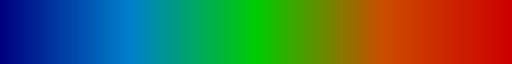

/tmp/ipykernel_91862/1082979607.py:12: RuntimeWarning: invalid value encountered in divide
  return (v1.T @ v2) / (np.linalg.norm(v1, axis=0) * np.linalg.norm(v2, axis=0))[:,None]


name_results: etTraces_decoder_1_mean_cosSim__mouse_B
name_results: etTraces_decoder_1_mean_projMag__mouse_B
name_results: etTraces_decoder_2_mean_cosSim__mouse_B
name_results: etTraces_decoder_2_mean_projMag__mouse_B
name_results: etTraces_decoder_3_mean_cosSim__mouse_B
name_results: etTraces_decoder_3_mean_projMag__mouse_B
name_results: etTraces_avgVector_mean_cosSim__mouse_B
name_results: etTraces_avgVector_mean_projMag__mouse_B


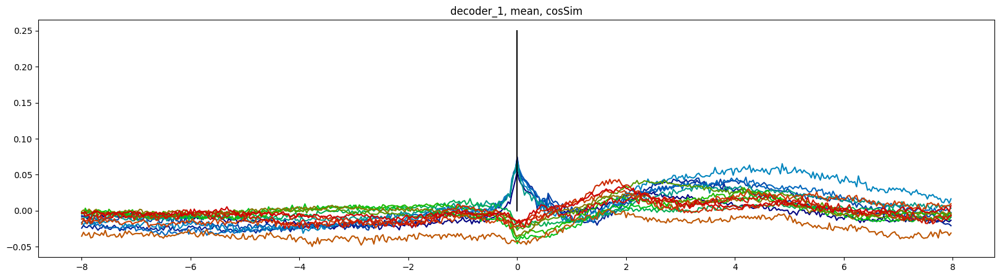

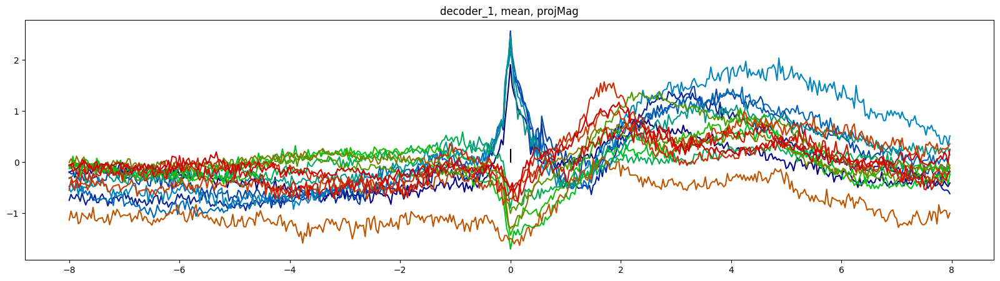

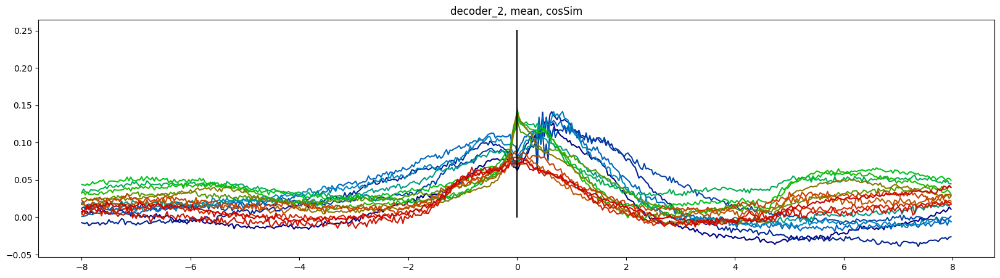

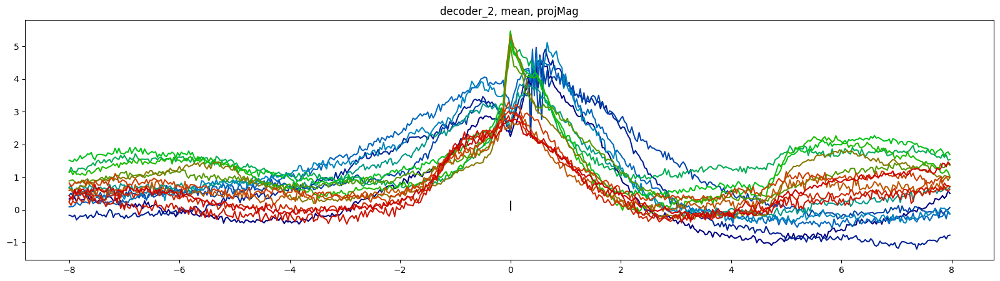

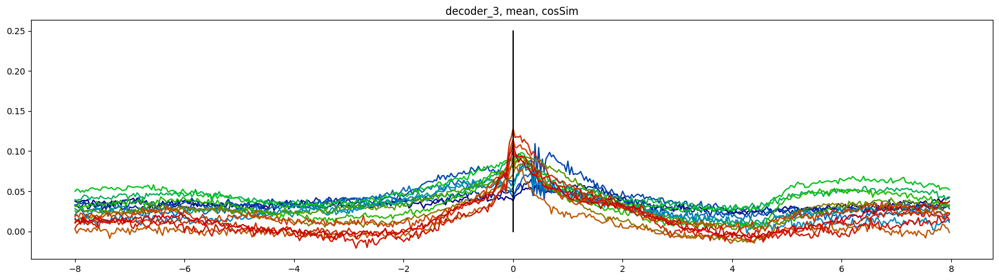

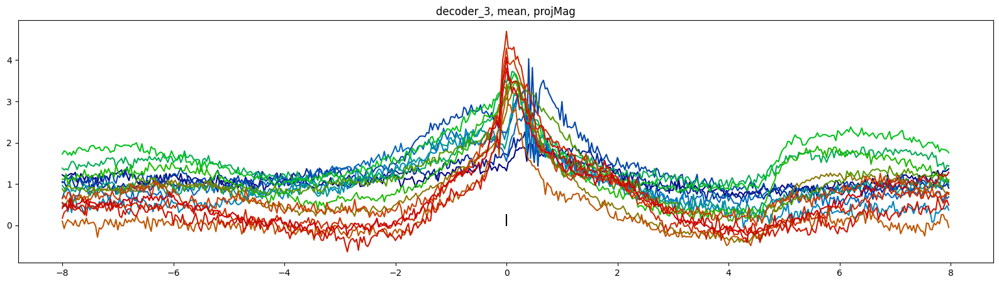

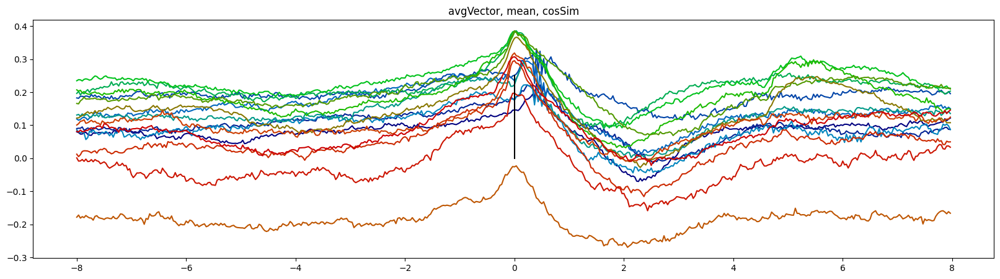

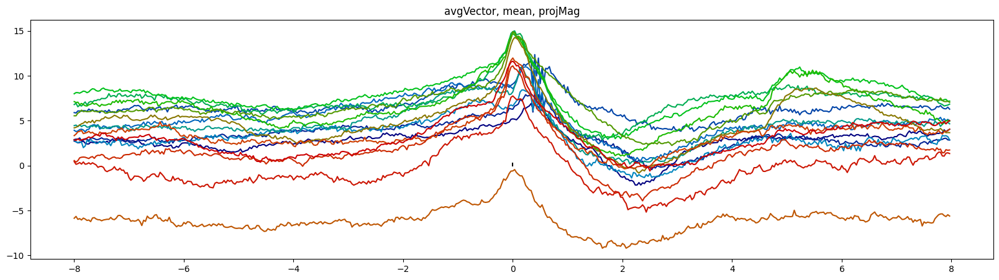

In [40]:
dir_save_results = r'/home/rich/Desktop/analysis_vectorSimilarity/'

# mouse = 'mouse_g1'

vecs_decoder = {
    'decoder_1': expParams_objs[dates_toUse[1]]['baselineStuff']['ROIs']['cellWeightings'],
    'decoder_2': expParams_objs[dates_toUse[6]]['baselineStuff']['ROIs']['cellWeightings'],
    'decoder_3': expParams_objs[dates_toUse[-1]]['baselineStuff']['ROIs']['cellWeightings'],
    'avgVector': np.ones(len(expParams_objs[dates_toUse[1]]['baselineStuff']['ROIs']['cellWeightings'])),
}

reductions = {
    'mean': np.nanmean,
#     'std': np.nanstd,
}

projectionTypes = {
    'cosSim': cosine_similarity,
    'projMag': projection_magnitude,
}

params = [
    vecs_decoder,
    reductions,
    projectionTypes
]

win_bounds = [-30*8, 30*8]
cmap = bnpm.plotting_helpers.simple_cmap([[0,0,0.5], [0,0.5,0.8], [0,0.8,0], [0.8,0.3,0], [0.8,0,0]])
display(cmap)
colors = cmap(np.linspace(0,0.999, len(dates_toUse)))

results = {}
for vec_decoder, reduction, projectionType in itertools.product(*[d.items() for d in params]):
    et_traces_reduced  = []
    for date in dates_toUse:
#         traces = sp_matched[date]
#         traces = dFoF_matched[date]
#         traces = dFoF_F_matched[date]
#         traces = dFoF_Fneu_matched[date]*0.7
        traces = loggerVals_rollZ[date].astype(np.float32)

        et_traces, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
            arr=projectionType[1](traces, vec_decoder[1]).squeeze(),  
#             arr=projectionType[1](traces, expParams_objs[date]['baselineStuff']['ROIs']['cellWeightings']).squeeze(),
            dim=-1,
            idx_triggers=trials_111_success[date]['frames_end'],
            win_bounds=win_bounds,
            verbose=1,
        )
        et_traces_reduced.append(reduction[1](et_traces, axis=0))
    et_traces_reduced = np.stack(et_traces_reduced, axis=1)

    
    fig = plt.figure(figsize=(20,5))
    plt.title(f'{vec_decoder[0]}, {reduction[0]}, {projectionType[0]}')
#     [plt.plot(xAxis/Fs, et_traces_reduced[:,ii] - np.nanmean(et_traces_reduced[:50,ii], axis=0), color=c) for ii,c in enumerate(colors)]
    [plt.plot(xAxis/Fs, et_traces_reduced[:,ii], color=c) for ii,c in enumerate(colors)]
    plt.plot([0,0], [0,0.25], 'k')
    
    name_results = f'etTraces_{vec_decoder[0]}_{reduction[0]}_{projectionType[0]}__{mouse}'
    print(f'name_results: {name_results}')
    
    results.update({name_results: et_traces_reduced})

#     dict_save = {
#         'et_traces': et_traces_reduced.astype(np.float32).copy(),
#         'axes': {
#             'time (s)': xAxis / Fs,
#             'sessions': dates_toUse,
#         },
#         'date_made': str(datetime.datetime.date(datetime.datetime.now())),
#         'notes': '2D matrix of event triggered traces. Traces are spike probabilities (from CASCADE) projected onto the decoder axis, then the event triggered average is taken across events within a session. \
# The neurons were aligned across sessions using ROICaT, and subselected to only be those that were included in the online decoder. Neurons for which there was not ROICaT match were excluded from the calculation.',
#         'data_type': 'spike_probability, CASCADE',
#         'projection_type': projectionType[0],
#         'reduction': reduction[0],
#         'decoder_ID': vec_decoder[0],
#         'animal_ID': mouse,
#     }

#     path_save = str(Path(dir_save_results) / f'{name_results}.pkl')
#     bnpm.file_helpers.pickle_save(dict_save, path_save, mkdir=True, allow_overwrite=False)


#     fig_saver = bnpm.plotting_helpers.Figure_Saver(dir_save_results, overwrite=True)
#     fig_saver(fig, name_file=name_results)

[[<matplotlib.lines.Line2D at 0x7f14e8459280>],

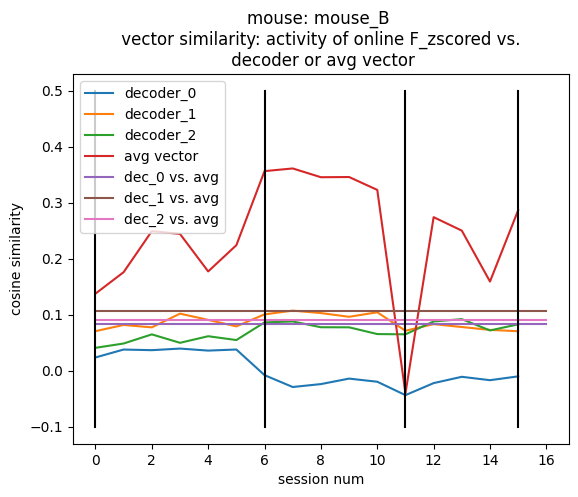

In [56]:
import sklearn
k = list(results.keys())

plt.figure()
[plt.plot(np.nanmean(results[k[ii]][235:240,:], axis=0)) for ii in range(0,len(results),2)]

dec_avg_cs = [sklearn.metrics.pairwise.cosine_similarity(decoders[ii][None,:], np.ones(len(decoders[ii]))[None,:]).squeeze() for ii in range(len(decoders))]
[plt.plot([0,n_sessions], [d, d]) for d in dec_avg_cs]

plt.xlabel('session num')
plt.ylabel('cosine similarity')
plt.title(f'mouse: {mouse} \n vector similarity: activity of online F_zscored vs. \n decoder or avg vector')
plt.legend(['decoder', 'avg vector', 'decoder vs. avg vec'])
plt.legend([f'decoder_{ii}' for ii in range(len(decoders))] + ['avg vector'] + [f'dec_{ii} vs. avg' for ii in range(len(decoders))])

[plt.plot([d,d], [-0.1, 0.5], 'k') for d in decoder_session_divisions]

Make dimensionality plot

In [40]:
import bnpm.torch_helpers

In [41]:
win_bounds = [-30*8, 30*8]

dims = []
for date in tqdm(dates_toUse):
#     arr = sp_matched[date]
    arr = loggerVals_rollZ[date]
#     arr = bnpm.torch_helpers.zscore(torch.as_tensor(arr), dim=1, nan_policy='omit').numpy()
    et_traces, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
        arr=arr,
#         arr=np.nan_to_num(loggerVals_rollZ[date]),
        idx_triggers=trials_111_success[date]['frames_end'],
        win_bounds=win_bounds,
        dim=-1,
    )
#     et_traces = bnpm.timeSeries.convolve_along_axis(et_traces, bnpm.math_functions.gaussian(sig=10), axis=-1, multicore_pref=True)
    et_traces = bnpm.timeSeries.convolve_torch(et_traces.transpose(2,0,1), bnpm.math_functions.gaussian(sig=10), padding='same').numpy().transpose(1,2,0)
    
#     plt.figure()
#     plt.imshow(np.nan_to_num(et_traces[:,:,230].T), aspect='auto', vmin=0, vmax=0.2)

#     dim = bnpm.decomposition.dimensionality_pca(np.nan_to_num(et_traces[:,:,165:225]).mean(2).T, ev=bnpm.math_functions.bounded_logspace(0.05, 0.99, 10), device='cpu')
    rate_at_thresh = (et_traces[:,:,195:200]).mean(2)
    dim = bnpm.decomposition.dimensionality_pca(np.nan_to_num(rate_at_thresh).T, ev=bnpm.math_functions.bounded_logspace(0.05, 0.99, 10), device='cpu')
    dims.append(dim)

dims = np.stack(dims, axis=0)

  0%|                                                     | 0/8 [00:00<?, ?it/s]/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:588: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at  ../aten/src/ATen/native/Convolution.cpp:882.)
  convolved = torch.nn.functional.conv1d(X_rshp, kernel_rshp, **conv1d_kwargs)
100%|█████████████████████████████████████████████| 8/8 [00:06<00:00,  1.29it/s]


In [42]:
bnpm.math_functions.bounded_logspace(0.05, 0.99, 10),

(array([0.05      , 0.0696697 , 0.09707733, 0.13526696, 0.18848016,
        0.26262711, 0.36594302, 0.50990277, 0.71049542, 0.99      ]),)

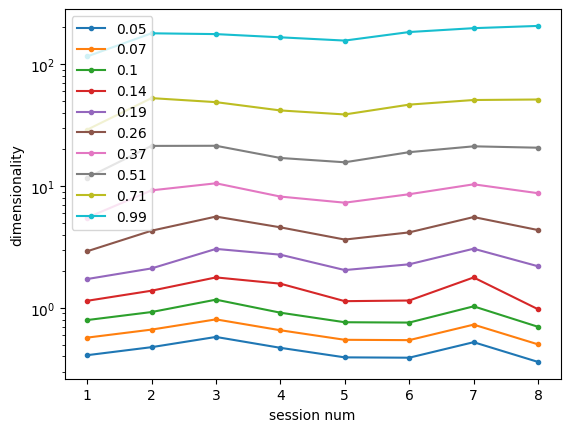

In [43]:
plt.figure()
plt.plot(np.arange(dims.shape[0])+1, dims, '.-')
plt.yscale('log');
plt.xlabel('session num')
plt.ylabel('dimensionality')

# [plt.plot([n+0.5,n+0.5], [0,dims.max()], 'k') for n in decoder_session_divisions];
plt.legend(np.round(bnpm.math_functions.bounded_logspace(0.05, 0.99, 10), decimals=2))

<IPython.core.display.Javascript object>


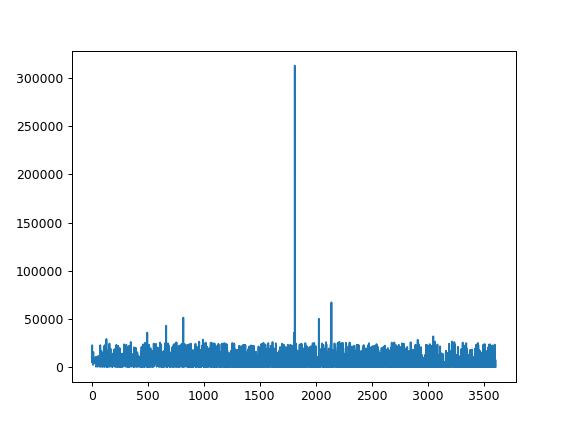

In [355]:
plt.figure()
plt.plot(np.nansum(sp_matched['20230113'], axis=1))

<IPython.core.display.Javascript object>


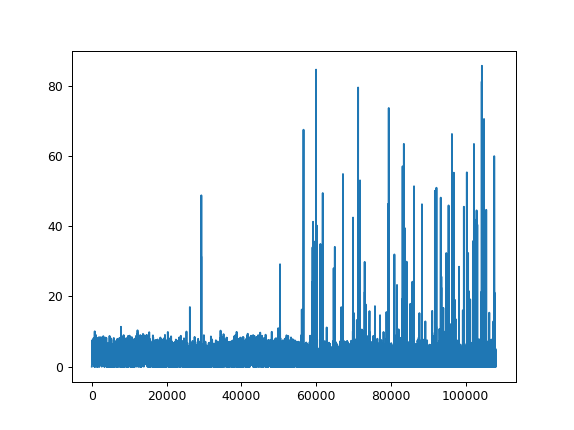

IndexError: index 1813 is out of bounds for axis 0 with size 846

In [359]:
plt.figure()
plt.plot(sp_matched['20230113'][1813])
plt.plot(dFoF_matched['20230113'][1813])

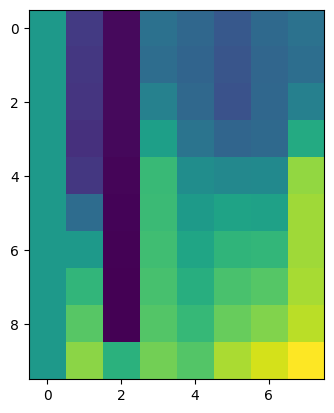

In [337]:
plt.figure()
plt.imshow((dims / dims[0][None,:]).T)

single neurons analysis

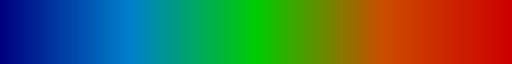

In [338]:
cmap = bnpm.plotting_helpers.simple_cmap([[0,0,0.5], [0,0.5,0.8], [0,0.8,0], [0.8,0.3,0], [0.8,0,0]])
display(cmap)
colors = cmap(np.linspace(0,0.999, len(dates_toUse)))

In [117]:
# win_bounds = [-30*4, 30*4]
idx_decoder_toUse = 0

idx = np.where([v==idx_decoder_toUse for v in decoder_dates.values()])[0]

preThresh_bounds = [110, 120]

et_traces_all, et_fanos, et_means, et_vars, et_dmeans, et_dvars = [], [], [], [], [], []
# plt.figure()
for ii,date in enumerate(dates_toUse):
    et_traces, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
        arr=sp_matched[date][np.argsort(decoders[idx_decoder_toUse])[::-1]],
#         arr=np.nan_to_num(loggerVals_rollZ[date][np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num(F_matched[date][np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num((F_matched[date] - Fneu_matched[date]*0.7)[np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num(lva[date].T[np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num(loggerValsAligned_objs[date].T[np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num(loggerVals_rollZ[date][np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num(lva_rollZ[date].T[np.argsort(decoders[idx_decoder_toUse])[::-1]]),
        idx_triggers=trials_111_success[date]['frames_end'],
        win_bounds=win_bounds,
#         trigger_signal_is_idx=True
    )
    
    et_traces_all.append(et_traces)

    et_mean = np.nanmean(np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1)
    et_var  = np.nanvar( np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1)
    
    et_dmean = np.nanmean(np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1) - np.nanmean(np.nanmean(et_traces[:,:,:50], axis=2), axis=1)
    et_dvar  = np.nanvar( np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1) - np.nanvar( np.nanmean(et_traces[:,:,:50], axis=2), axis=1)

    et_fano = np.abs(et_var / et_mean)
    
    et_fanos.append(et_fano)
    et_means.append(et_mean)
    et_vars.append(et_var)
    et_dmeans.append(et_dmean)
    et_dvars.append(et_dvar)

et_fanos = np.stack(et_fanos, axis=0)
et_means = np.stack(et_means, axis=0)
et_vars = np.stack(et_vars, axis=0)
et_dmeans = np.stack(et_dmeans, axis=0)
et_dvars = np.stack(et_dvars, axis=0)

/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:329: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
/tmp/ipykernel_3162970/2620790633.py:27: RuntimeWarning: Mean of empty slice
  et_mean = np.nanmean(np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1)
/tmp/ipykernel_3162970/2620790633.py:28: RuntimeWarning: Degrees of freedom <= 0 for slice.
  et_var  = np.nanvar( np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1)
/tmp/ipykernel_3162970/2620790633.py:30: RuntimeWarning: Mean of empty slice
  et_dmean = np.nanmean(np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1) - np.nanmean(np.nanmean(et_traces[:,:,:50], axis=2), axis=1)
/tmp/ipykernel_3162970/2620790633.py:31: RuntimeWarning: Degrees of freedom <= 0 f

<IPython.core.display.Javascript object>


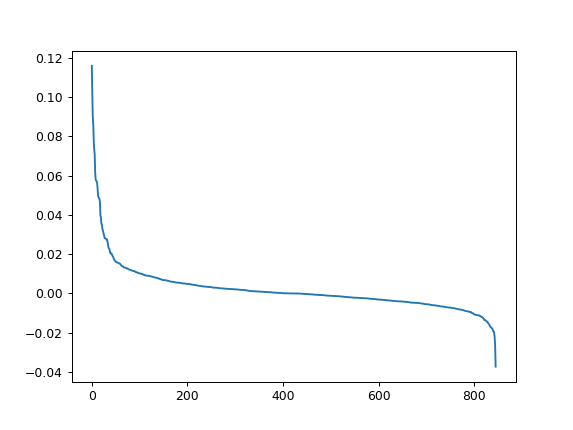

In [118]:
plt.figure()
plt.plot(decoders[idx_decoder_toUse][np.argsort(decoders[idx_decoder_toUse])[::-1]])

<IPython.core.display.Javascript object>


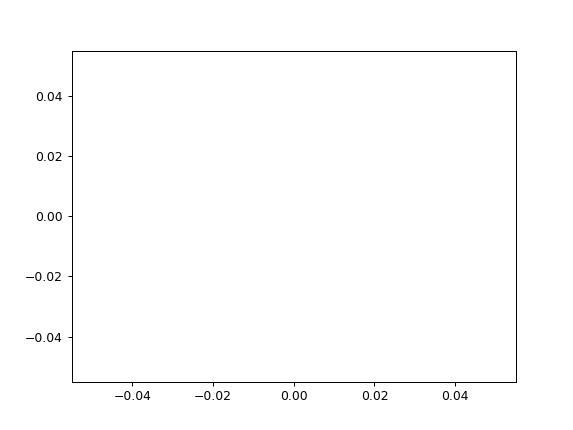

/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/plotting_helpers.py:184: RuntimeWarning: Mean of empty slice
  y_center = reduction_center(data, axis=1)
/media/rich/OS/Users/Richard/Linux_stuff_on_OS/conda_envs/envs/ROICaT/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


<AxesSubplot:>

In [119]:
val = et_dmeans.copy()

%matplotlib notebook
plt.figure()
bnpm.plotting_helpers.shaded_error_bar(val[idx,:30])
# bnpm.plotting_helpers.shaded_error_bar(val[idx,:100])
# bnpm.plotting_helpers.shaded_error_bar(val[idx,100:-100])
# bnpm.plotting_helpers.shaded_error_bar(val[idx,-5:])
# plt.ylim([0,1])

In [72]:
import bnpm.similarity

In [73]:
# lva = {date: bnpm.similarity.pairwise_orthogonalization(np.nan_to_num(np.array(loggerValsAligned_objs[date], dtype=np.float32)), np.nan_to_num(F_matched[date].T))[0] for date in dates_toUse}

In [ ]:
# wlen = Fs * 60 * 15

# lva_rollZ = {date: zscore_rolling(l, wlen=wlen, X_denom=loggerValsAligned_objs[date]) for date,l in tqdm(lva.items())}

/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/plotting_helpers.py:184: RuntimeWarning: Mean of empty slice
  y_center = reduction_center(data, axis=1)
/media/rich/OS/Users/Richard/Linux_stuff_on_OS/conda_envs/envs/ROICaT/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


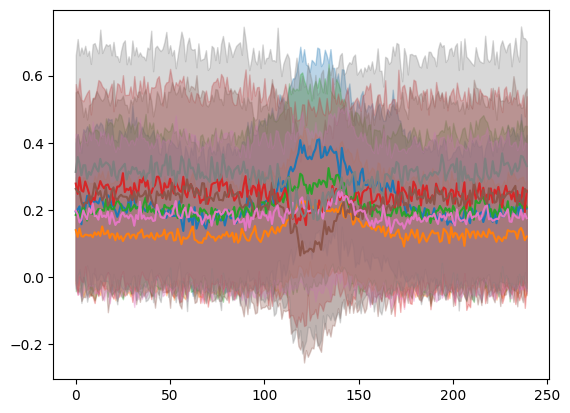

In [351]:
idx_decoder_toUse = 0

plt.figure()
for date in dates_toUse:
    arr = dFoF_matched[date][np.argsort(decoders[idx_decoder_toUse])[::-1]][10]
#     arr = sp_matched[date][30]
    # date = '20221021'
    et_traces, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
#         arr=sp_matched[date].T @ expParams_objs[date]['baselineStuff']['ROIs']['cellWeightings'],
#         arr=sp_raw[date] - np.mean(sp_raw[date], axis=1, keepdims=True),
        arr=arr,
    #     arr=loggerAligned_dfs[date]['decoder']['cursor_brain_raw'].to_numpy(),
    #     arr=sp_matched[date].mean(0),
        trigger_signal=trials_111_success[date]['frames_end'],
    #     trigger_signal=t[:],
        win_bounds=[-30*4, 30*4],
        trigger_signal_is_idx=True,
#         show_plot=True
    )

#     out_mean = et_traces.mean(1)
#     out_mean = out_mean[np.logical_not(np.isnan(out_mean.mean(1)))]
    
#     plt.figure()
# #     plt.imshow(np.nan_to_num(et_traces).mean(1), clim=[-0.02,0.06], aspect='auto', extent=(xAxis[0], xAxis[-1], mean_traces_sorted.shape[0], 0))
#     plt.imshow(out_mean, clim=[-0.02,0.15], aspect='auto', extent=(xAxis[0], xAxis[-1], out_mean.shape[0], 0))
#     plt.plot([0,0], [0, out_mean.shape[0]], 'r')
# #     break
    bnpm.plotting_helpers.shaded_error_bar(et_traces.T)

In [296]:
et_traces.shape

(846, 128, 240)

<IPython.core.display.Javascript object>


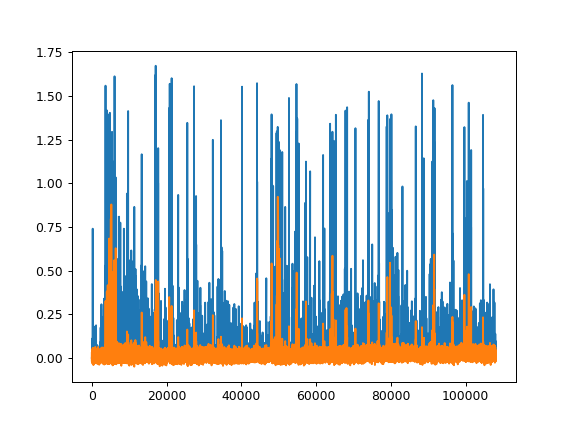

In [310]:
plt.figure()
plt.plot(sp_matched['20230119'][123])
plt.plot(dFoF_matched['20230119'][123]/10)

In [50]:
%matplotlib notebook
actVecs = {}
trajs = {}
# for date in dates_toUse:
for date in tqdm(dates_toUse[:]):
    arr = loggerVals_rollZ[date]
#     arr = sp_matched[date]
#     arr = sp_raw[date]
#     arr = F_matched[date]
#     arr = dFoF_matched[date]
#     arr = arr[np.argsort(decoders[idx_decoder_toUse])[::-1]]
    # date = '20221021'
    et_traces, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
#         arr=sp_matched[date].T @ expParams_objs[date]['baselineStuff']['ROIs']['cellWeightings'],
#         arr=sp_raw[date] - np.mean(sp_raw[date], axis=1, keepdims=True),
        arr=arr,
    #     arr=loggerAligned_dfs[date]['decoder']['cursor_brain_raw'].to_numpy(),
    #     arr=sp_matched[date].mean(0),
        idx_triggers=trials_111_success[date]['frames_end'],
    #     trigger_signal=t[:],
        win_bounds=[-30*4, 30*4],
        dim=-1,
#         trigger_signal_is_idx=True,
#         show_plot=True
    )
    et_traces[np.abs(et_traces) > 5] = np.nan
    
    et_traces = np.nan_to_num(et_traces)
    
    out_traj = et_traces[:,:,:120] - et_traces[:,:,:50].mean(2, keepdims=True)
    trajs.update({date: out_traj})

#     out_mean = np.nanmean(et_traces, axis=1)
    out_mean = np.nanmean(et_traces[:,:,105:120], axis=2) - np.nanmean(et_traces[:,:,:50], axis=2)
#     out_mean = np.nanmean(et_traces[:,:,80:85], axis=2) - np.nanmean(et_traces[:,:,:50], axis=2)
#     out_mean = out_mean[np.logical_not(np.isnan(out_mean.mean(1)))]
    out_mean = np.nan_to_num(out_mean)
    
#     out_mean = out_mean[np.argsort(decoders[idx_decoder_toUse])[::-1]]
    
    actVecs.update({date: out_mean})
    
#     plt.figure()
# #     plt.imshow(np.nan_to_num(et_traces).mean(1), clim=[-0.02,0.06], aspect='auto', extent=(xAxis[0], xAxis[-1], mean_traces_sorted.shape[0], 0))
#     plt.imshow(
#         out_mean.T, 
#         clim=[-0.02,2.15],
#         aspect='auto', 
# #         extent=(xAxis[0], xAxis[-1], out_mean.shape[0], 0)
#     )
# #     plt.plot([0,0], [0, out_mean.shape[0]], 'r')
# #     break

  0%|                                                     | 0/8 [00:00<?, ?it/s]/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.15it/s]


In [340]:
date

'20230119'

In [341]:
import scipy.stats

<IPython.core.display.Javascript object>


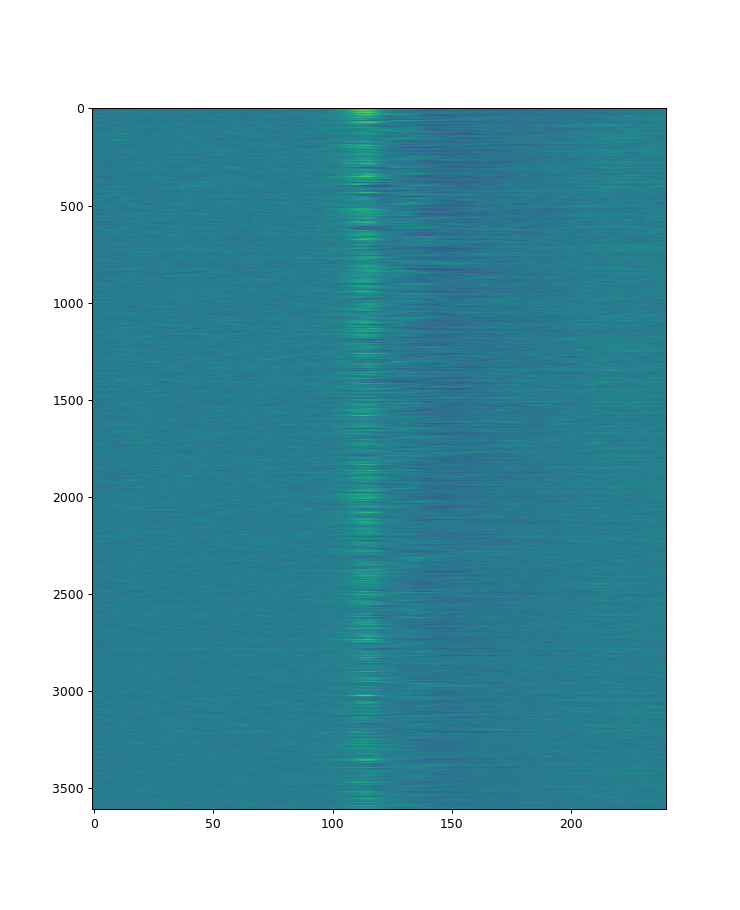

In [342]:
plt.figure()
plt.imshow(np.nan_to_num(scipy.stats.zscore(np.nanmean(et_traces, axis=1), axis=1, nan_policy='omit')), aspect='auto')

In [343]:
et_traces.shape

(3608, 237, 240)

In [344]:
actVecs_cat = np.concatenate([v for v in actVecs.values()], axis=1) 
actVecs_cc = np.corrcoef(actVecs_cat.T)

In [345]:
traj_cat = np.concatenate([v for v in trajs.values()], axis=1) 

In [346]:
traj_cat.shape

(3608, 1545, 120)

In [347]:
actVecs_cc_rolling = np.stack([np.pad(np.diag(actVecs_cc, k=ii), pad_width=(ii,0), mode='constant', constant_values=np.nan) for ii in range(1,300)], axis=1)

In [348]:
trial_num_cumsum = np.concatenate(([0], np.cumsum([l.shape[1] for l in actVecs.values()])[:]))

<IPython.core.display.Javascript object>


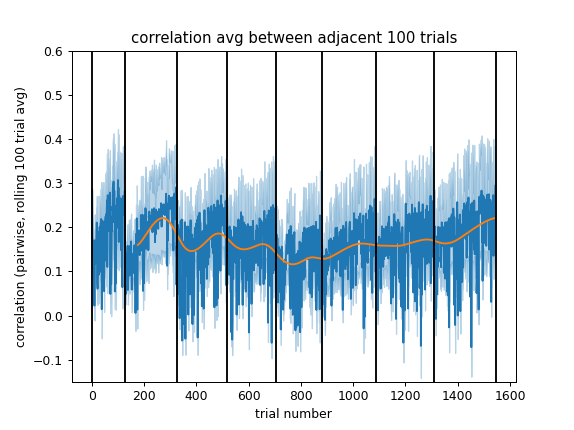

/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/plotting_helpers.py:184: RuntimeWarning: Mean of empty slice
  y_center = reduction_center(data, axis=1)
/media/rich/OS/Users/Richard/Linux_stuff_on_OS/conda_envs/envs/ROICaT/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_3162970/17491170.py:3: RuntimeWarning: Mean of empty slice
  plt.plot(bnpm.timeSeries.simple_smooth(np.nanmean(actVecs_cc_rolling, axis=1), sig=50))


(-0.15, 0.6)

In [349]:
plt.figure()
bnpm.plotting_helpers.shaded_error_bar(actVecs_cc_rolling)
plt.plot(bnpm.timeSeries.simple_smooth(np.nanmean(actVecs_cc_rolling, axis=1), sig=50))

[plt.plot([n,n], [-0.15, 0.6], 'k') for n in trial_num_cumsum]

plt.xlabel('trial number')
plt.ylabel('correlation (pairwise, rolling 100 trial avg)')
plt.title('correlation avg between adjacent 100 trials')
plt.ylim([-0.15, 0.6])

In [350]:
actVecs_cc_seshMean = np.array([np.triu(actVecs_cc[idx1:idx2]).mean() for idx1,idx2 in zip(trial_num_cumsum[:-1], trial_num_cumsum[1:])])
actVecs_cc_seshStd = np.array([np.triu(actVecs_cc[idx1:idx2]).std() for idx1,idx2 in zip(trial_num_cumsum[:-1], trial_num_cumsum[1:])])
actVecs_cc_seshSem = actVecs_cc_seshStd / np.sqrt(trial_num_cumsum[1:])

<IPython.core.display.Javascript object>


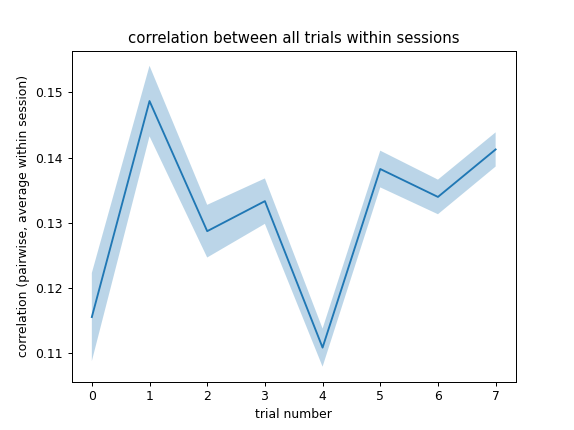

Text(0.5, 1.0, 'correlation between all trials within sessions')

In [351]:
plt.figure()
plt.plot(np.arange(len(actVecs_cc_seshMean)), actVecs_cc_seshMean)
plt.fill_between(np.arange(len(actVecs_cc_seshMean)), actVecs_cc_seshMean - actVecs_cc_seshSem, actVecs_cc_seshMean + actVecs_cc_seshSem, alpha=0.3)

plt.xlabel('trial number')
plt.ylabel('correlation (pairwise, average within session)')
plt.title('correlation between all trials within sessions')

<IPython.core.display.Javascript object>


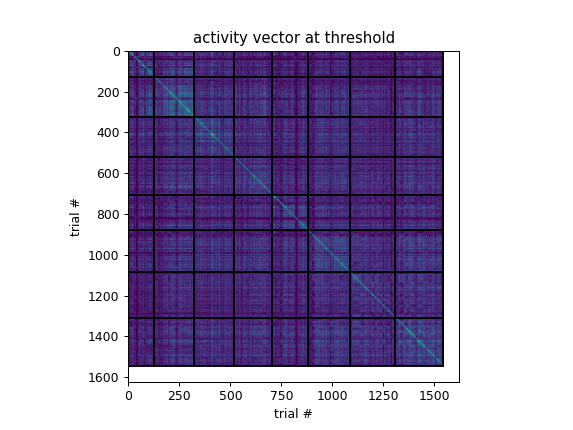

In [291]:
plt.figure()
plt.imshow(actVecs_cc, clim=[-0.0, 0.6])
plt.xlabel('trial #')
plt.ylabel('trial #')
plt.title('activity vector at threshold')
[plt.plot([n,n],[0,trial_num_cumsum[-1]], 'k') for n in trial_num_cumsum]
[plt.plot([0,trial_num_cumsum[-1]], [n,n], 'k') for n in trial_num_cumsum];

In [249]:
import tensorly as tl

In [250]:
tl.set_backend('pytorch')

In [366]:
tca = tl.decomposition.CP_NN_HALS(
    rank=4,
    n_iter_max=100,
    init='svd',
    svd='truncated_svd',
    tol=1e-08,
    sparsity_coefficients=None,
    fixed_modes=None,
    nn_modes='all',
    exact=False,
    verbose=True,
    normalize_factors=True,
    cvg_criterion='abs_rec_error',
    random_state=None,
)

# comps = tca.fit_transform(torch.as_tensor(np.nan_to_num(traj_cat[:,:,:120]), dtype=torch.float32, device='cuda:0'))
comps = tca.fit_transform(torch.as_tensor(np.nan_to_num(actVecs_cat), dtype=torch.float32, device='cuda:0'))

/media/rich/OS/Users/Richard/Linux_stuff_on_OS/conda_envs/envs/ROICaT/lib/python3.9/site-packages/tensorly/backend/pytorch_backend.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(


reconstruction error=0.8988085985183716
iteration 1, reconstruction error: 0.8968163132667542, decrease = 0.0019922852516174316
iteration 2, reconstruction error: 0.8961344361305237, decrease = 0.0006818771362304688
iteration 3, reconstruction error: 0.8958242535591125, decrease = 0.0003101825714111328
iteration 4, reconstruction error: 0.8956522941589355, decrease = 0.00017195940017700195
iteration 5, reconstruction error: 0.8955457210540771, decrease = 0.00010657310485839844
iteration 6, reconstruction error: 0.8954741358757019, decrease = 7.158517837524414e-05
iteration 7, reconstruction error: 0.8954242467880249, decrease = 4.988908767700195e-05
iteration 8, reconstruction error: 0.8953887224197388, decrease = 3.552436828613281e-05
iteration 9, reconstruction error: 0.8953630328178406, decrease = 2.568960189819336e-05
iteration 10, reconstruction error: 0.8953443169593811, decrease = 1.8715858459472656e-05
iteration 11, reconstruction error: 0.8953306078910828, decrease = 1.3709068

In [264]:
comps = tl.decomposition.non_negative_parafac_hals(
#     tensor=torch.as_tensor(np.nan_to_num(actVecs_cat), dtype=torch.float32, device='cuda:0'),
    tensor=torch.as_tensor(np.nan_to_num(traj_cat[:,:,:120]), dtype=torch.float32, device='cuda:0'),
    rank=4,
    
    n_iter_max=1000,
    init='svd',
    svd='truncated_svd',
    tol=1e-08,
    random_state=None,
    sparsity_coefficients=[10,1,1],
    fixed_modes=None,
    nn_modes='all',
    exact=False,
    normalize_factors=True,
    verbose=True,
    return_errors=False,
    cvg_criterion='abs_rec_error',
    
#     n_iter_max=100,
#     init='svd',
#     svd='truncated_svd',
#     tol=1e-06,
#     random_state=None,
#     verbose=0,
#     normalize_factors=False,
#     return_errors=False,
#     mask=None,
#     cvg_criterion='abs_rec_error',
#     fixed_modes=None,
)

reconstruction error=0.9865286350250244
iteration 1, reconstruction error: 0.9848664402961731, decrease = 0.0016621947288513184
iteration 2, reconstruction error: 0.9845442771911621, decrease = 0.00032216310501098633
iteration 3, reconstruction error: 0.9842420816421509, decrease = 0.00030219554901123047
iteration 4, reconstruction error: 0.9840381145477295, decrease = 0.00020396709442138672
iteration 5, reconstruction error: 0.9839561581611633, decrease = 8.195638656616211e-05
iteration 6, reconstruction error: 0.9839246869087219, decrease = 3.147125244140625e-05
iteration 7, reconstruction error: 0.9839088916778564, decrease = 1.5795230865478516e-05
iteration 8, reconstruction error: 0.9838984608650208, decrease = 1.043081283569336e-05
iteration 9, reconstruction error: 0.9838902354240417, decrease = 8.225440979003906e-06
iteration 10, reconstruction error: 0.9838830828666687, decrease = 7.152557373046875e-06
iteration 11, reconstruction error: 0.9838762283325195, decrease = 6.854534

<IPython.core.display.Javascript object>


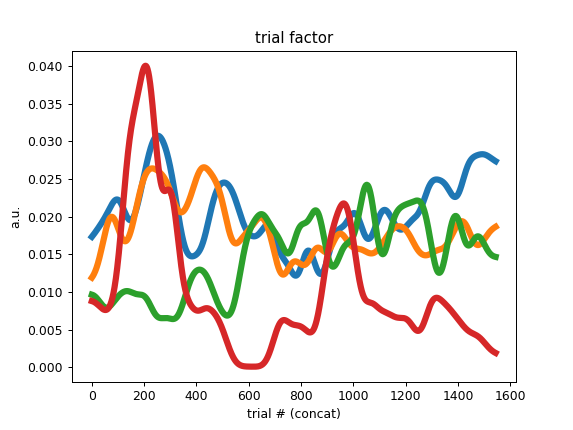

100%|█████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 32961.13it/s]


Text(0.5, 1.0, 'trial factor')

In [265]:
plt.figure()
# plt.plot(comps.factors[1])
plt.plot(bnpm.timeSeries.simple_smooth(comps.factors[1].cpu().numpy(), sig=40), linewidth=5);
plt.xlabel('trial # (concat)')
plt.ylabel('a.u.')
plt.title('trial factor')

<IPython.core.display.Javascript object>


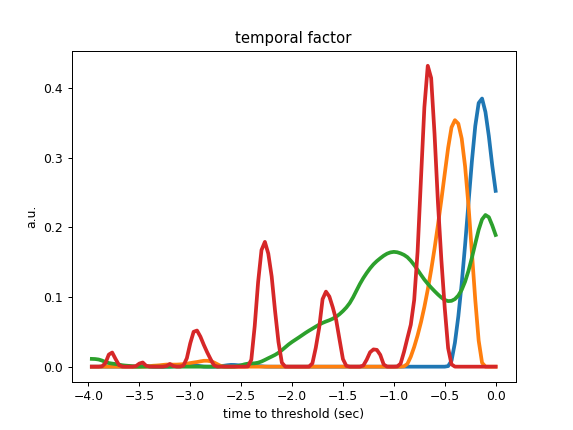

100%|█████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 61455.00it/s]


Text(0.5, 1.0, 'temporal factor')

In [266]:
plt.figure()
# plt.plot(comps.factors[1])
plt.plot(-np.arange(comps.factors[2].shape[0])[::-1]/Fs, bnpm.timeSeries.simple_smooth(comps.factors[2].cpu().numpy(), sig=1), linewidth=3);
plt.xlabel('time to threshold (sec)')
plt.ylabel('a.u.')
plt.title('temporal factor')

<IPython.core.display.Javascript object>


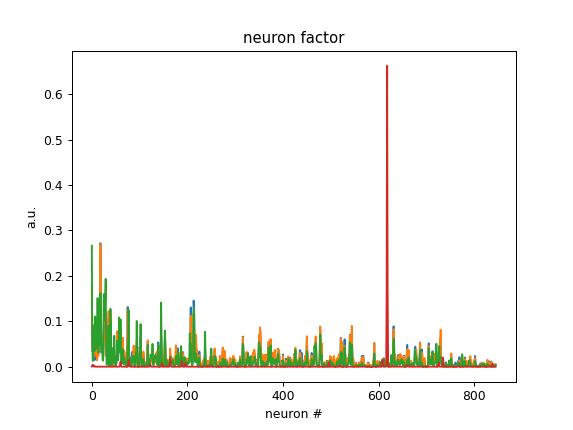

100%|█████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 74565.40it/s]


Text(0.5, 1.0, 'neuron factor')

In [267]:
plt.figure()
# plt.plot(comps.factors[1])
plt.plot(bnpm.timeSeries.simple_smooth(comps.factors[0].cpu().numpy(), sig=1));
plt.xlabel('neuron #')
plt.ylabel('a.u.')
plt.title('neuron factor')

In [268]:
import sklearn

In [269]:
test2 = sklearn.metrics.pairwise.cosine_similarity(comps.factors[0].cpu().numpy().T, Y=decoders, dense_output=True)

<IPython.core.display.Javascript object>


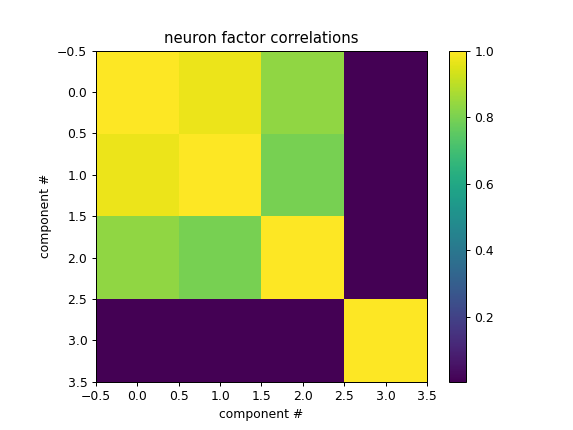

In [270]:
test = sklearn.metrics.pairwise.cosine_similarity(comps.factors[0].cpu().numpy().T, dense_output=True)

plt.figure()
plt.imshow(test)
plt.xlabel('component #')
plt.ylabel('component #')
plt.title('neuron factor correlations')
plt.colorbar()

In [271]:
test = sklearn.metrics.pairwise.cosine_similarity(comps.factors[0].cpu().numpy().T, Y=actVecs_cat.T, dense_output=True)

<IPython.core.display.Javascript object>


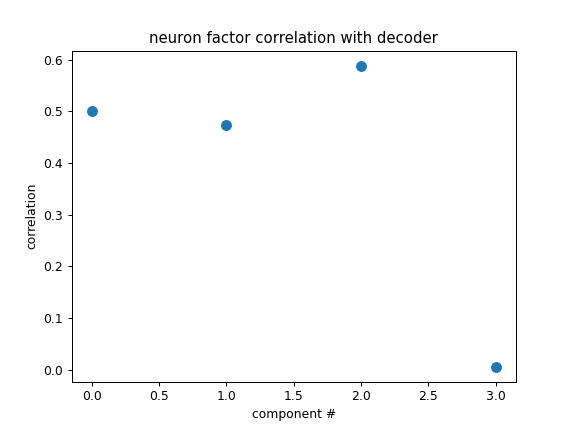

Text(0.5, 1.0, 'neuron factor correlation with decoder')

In [272]:
plt.figure()
plt.scatter(np.arange(len(test2)), test2, s=60)
plt.xlabel('component #')
plt.ylabel('correlation')
plt.title('neuron factor correlation with decoder')

In [844]:
arr.shape

(846, 108000)

In [864]:
peaks.shape

(846,)

/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np

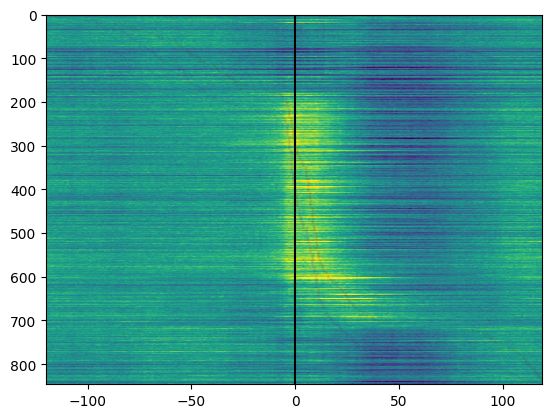

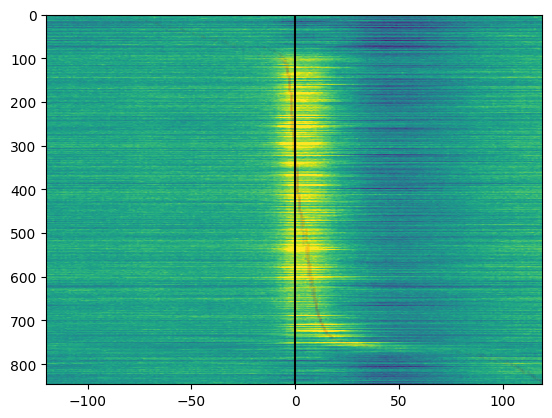

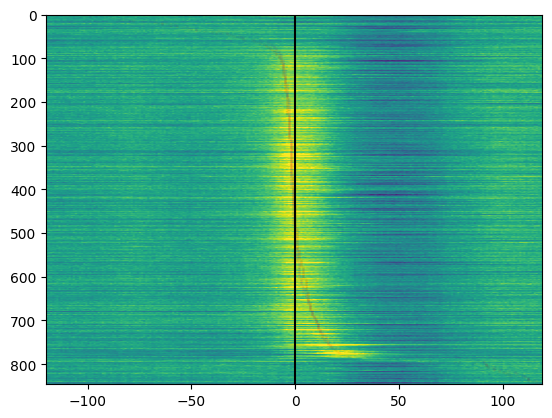

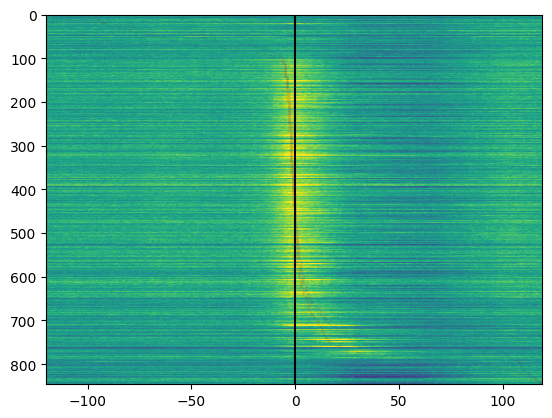

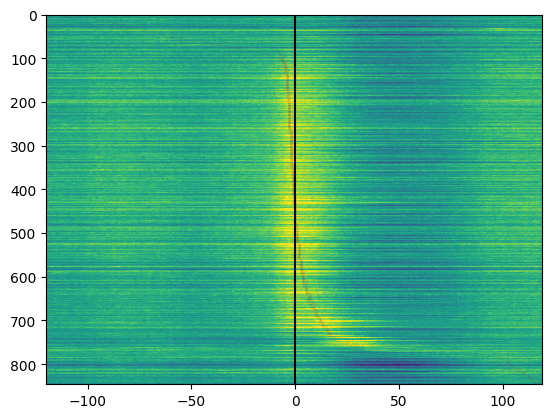

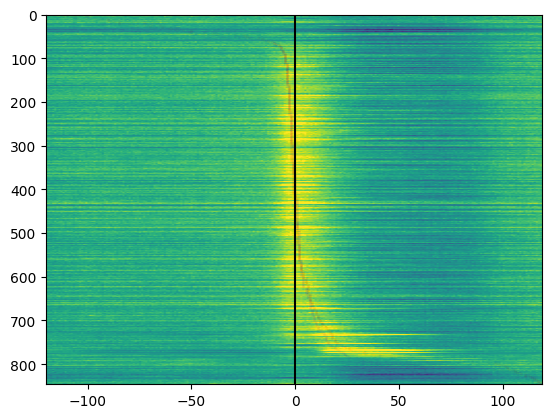

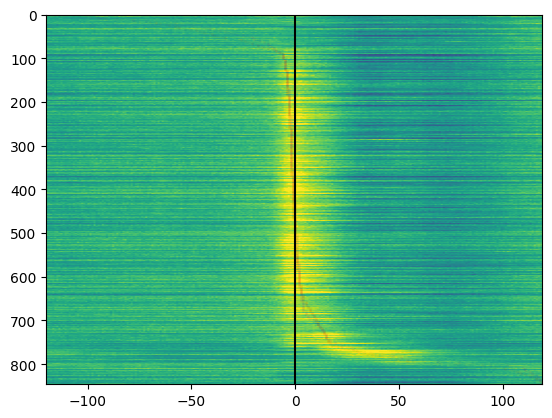

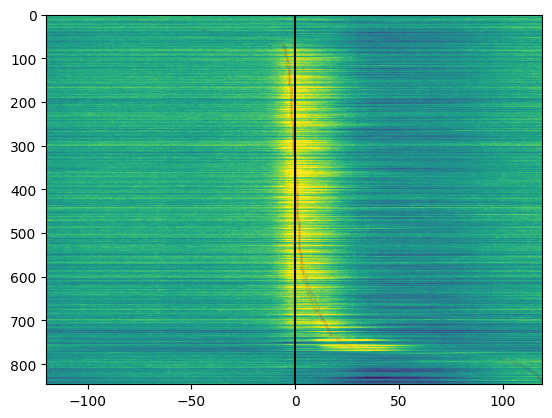

In [890]:
# for date in dates_toUse:
for date in dates_toUse[:]:
#     arr = sp_matched[date] - np.mean(sp_matched[date], axis=1, keepdims=True)
#     arr = sp_raw[date] - np.mean(sp_raw[date], axis=1, keepdims=True)
#     arr = dFoF_matched[date] - np.mean(dFoF_matched[date], axis=1, keepdims=True)
    arr = np.array(loggerVals_rollZ[date], dtype=np.float32)
    # date = '20221021'
    mean_traces_sorted, peaks_train_sorted, peaks_test_sorted, cv_idx, et_traces, xAxis, windows = bnpm.timeSeries.make_sorted_event_triggered_average(
#         arr=sp_matched[date].T @ expParams_objs[date]['baselineStuff']['ROIs']['cellWeightings'],
#         arr=sp_raw[date] - np.mean(sp_raw[date], axis=1, keepdims=True),
        arr=arr,
    #     arr=loggerAligned_dfs[date]['decoder']['cursor_brain_raw'].to_numpy(),
    #     arr=sp_matched[date].mean(0),
        idx_triggers=trials_111_success[date]['frames_end'],
    #     trigger_signal=t[:],
        win_bounds=[-30*4, 30*4],
        dim=-1,
#         trigger_signal_is_idx=True,
#         show_plot=True
    )

    plt.figure()
#     plt.imshow(mean_traces_sorted, clim=[-0.1, 0.2], aspect='auto', extent=(xAxis[0], xAxis[-1], mean_traces_sorted.shape[0], 0))
    plt.imshow(mean_traces_sorted, clim=[-1.0, 1.0], aspect='auto', extent=(xAxis[0], xAxis[-1], mean_traces_sorted.shape[0], 0))
    plt.plot([0,0], [0, mean_traces_sorted.shape[0]], 'k')
    plt.scatter(xAxis[peaks_train_sorted], np.arange(len(peaks_train_sorted)), c='r', s=2, alpha=0.01)
    plt.scatter(xAxis[peaks_test_sorted], np.arange(len(peaks_test_sorted)), c='m', s=2, alpha=0.01)
#     break

In [25]:
import ScanImageTiffReader

In [26]:
import bnpm.video

In [27]:
paths_videos = bnpm.path_helpers.find_paths('/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119', reMatch='exp_00001_')[:]

display(paths_videos)

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00001.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00002.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00003.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00004.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00005.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00006.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00007.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00008.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00009.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00

In [32]:
triggers_start = trials_111_success['20230119']['frames_start']
triggers_end = trials_111_success['20230119']['frames_end']

In [33]:
frames_trs = np.cumsum([0] + [1000 for t in paths_videos])

In [34]:
xShifts = np.nan_to_num(loggerAligned_dfs['20230119']['motionCorrection']['xShift'].to_numpy()).astype(int)
yShifts = np.nan_to_num(loggerAligned_dfs['20230119']['motionCorrection']['yShift'].to_numpy()).astype(int)

xShifts_blocks = list(bnpm.indexing.make_batches(xShifts, batch_size=1000))
yShifts_blocks = list(bnpm.indexing.make_batches(yShifts, batch_size=1000))

In [35]:
import gc

In [36]:
from functools import partial

In [37]:
def get_frames(path, xs=None, ys=None):
    tr = ScanImageTiffReader.ScanImageTiffReader(path)
#     if xs is not None:
#         f = bnpm.image_processing.apply_shifts_along_axis(tr.data(), xShifts=xs, yShifts=ys, workers=1)
#     else:
    f = tr.data()
    tr.close()
    del tr
    gc.collect()
    gc.collect()
#     return f
    return bnpm.image_processing.bin_array(f, [1,2,2], function=partial(np.mean, dtype=f.dtype))
frames = bnpm.parallel_helpers.map_parallel(get_frames, [paths_videos[:75], xShifts_blocks[:75], yShifts_blocks[:75]], workers=16, method='multithreading')
# frames = []
# for ii, (tr,x,y) in tqdm(enumerate(zip(paths_videos, xShifts_blocks, yShifts_blocks)), total=len(paths_videos)):
#     frames.append(get_frames(tr, x, y))
#     if ii >= 75:
#         break

100%|██████████████████████████████████████████████████████████████████████████████| 75/75 [03:24<00:00,  2.72s/it]


In [38]:
import torch

In [39]:
frames_cat = torch.cat([torch.as_tensor(f, dtype=torch.int16) for f in frames[:]], dim=0)

In [40]:
et_traces_end = bnpm.timeSeries.event_triggered_traces_torch(frames_cat, triggers_end[:184], win_bounds=[-10,0], dim=0)[0].numpy().mean(-1).astype(np.int16)
et_traces_start = bnpm.timeSeries.event_triggered_traces_torch(frames_cat, triggers_start[:184], win_bounds=[-10,0], dim=0)[0].numpy().mean(-1).astype(np.int16)
et_traces_delta = et_traces_end - et_traces_start

<IPython.core.display.Javascript object>


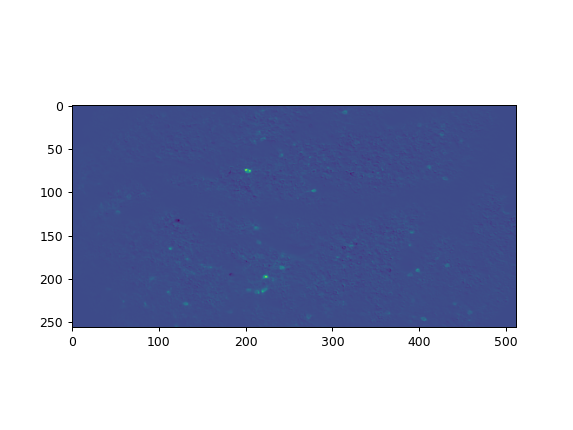

In [306]:
plt.figure()
plt.imshow(et_traces_delta.mean(-1))

In [307]:
et_traces_delta.shape

(256, 512, 184)

In [311]:
frames_cat.shape

torch.Size([75000, 256, 512])

In [ ]:
test = bnpm.timeSeries.rolling_percentile_rq_multicore(et_traces_start[:,:,0], window=7, ptile=50)

<IPython.core.display.Javascript object>


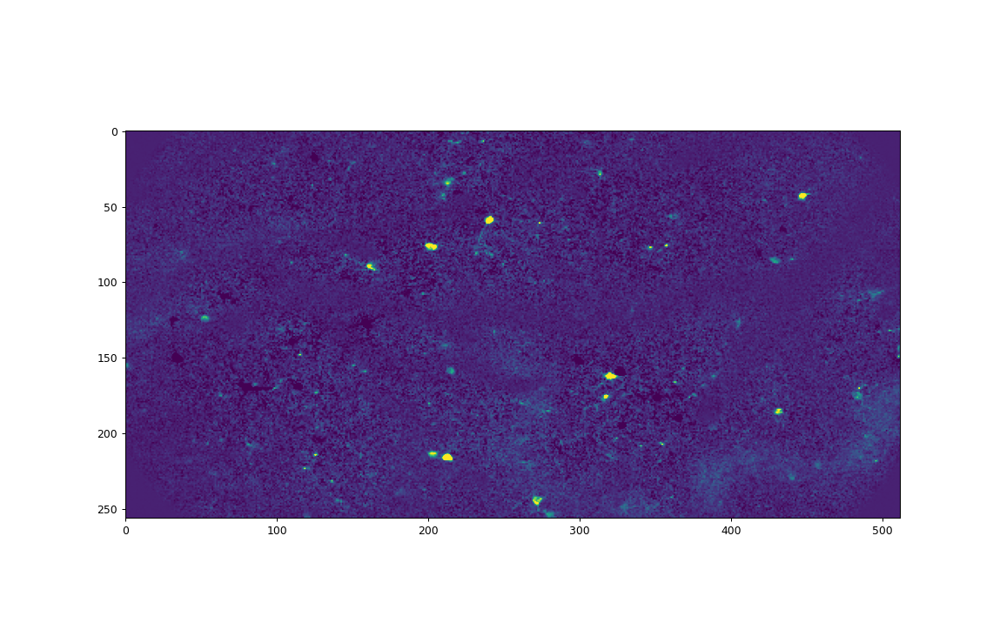

interactive(children=(IntSlider(value=0, description='i_frame', max=183), Output()), _dom_classes=('widget-int…

In [309]:
bnpm.plotting_helpers.display_toggle_image_stack(et_traces_delta.transpose(2,0,1), clim=[-100,1000])

In [69]:
from bnpm.video import play_video_cv2

In [136]:
et_traces_ms = et_traces.type(torch.float32) - et_traces[:,:,:,:10].type(torch.float32).mean(-1, keepdims=True)

In [137]:
et_traces.shape

torch.Size([256, 512, 184, 90])

In [258]:
vid = (et_traces_ms.type(torch.float32).median(-2)[0] * 2**8 / 2**16).permute(2,0,1)

In [ ]:
vid.numpy().astype(np.uint8).shape

In [260]:
play_video_cv2(vid.numpy().astype(np.uint8)*50 + 50, frameRate=30)

100%|██████████████████████████████████████████████████████████████████████████████| 90/90 [00:03<00:00, 27.21it/s]


<IPython.core.display.Javascript object>


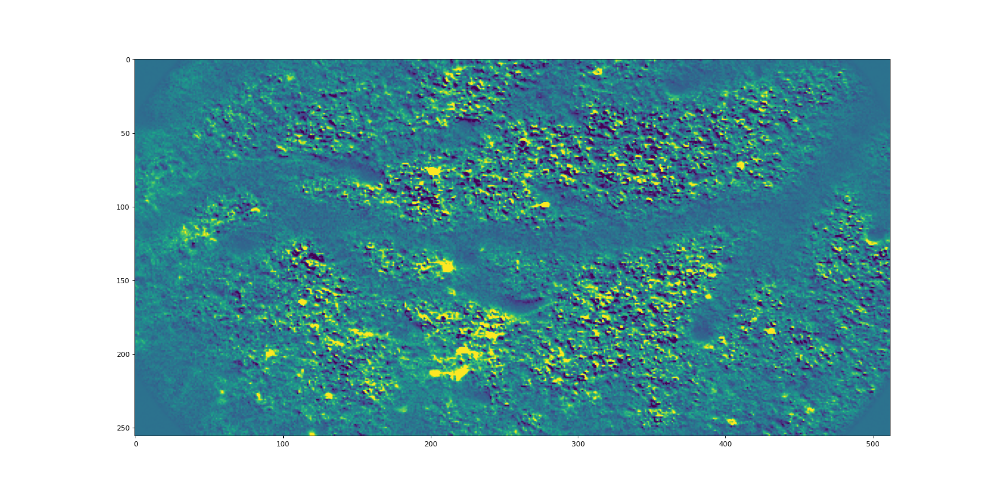

In [264]:
plt.figure()
plt.imshow(vid[-1], clim=[-0.3, 0.5])

In [148]:
trials = et_traces_ms[...,-25:].mean(-1).permute(2,0,1).reshape(et_traces.shape[2], -1)

In [149]:
trials.shape

torch.Size([184, 131072])

In [150]:
trials_cc = torch.corrcoef(trials[:,:])

<IPython.core.display.Javascript object>


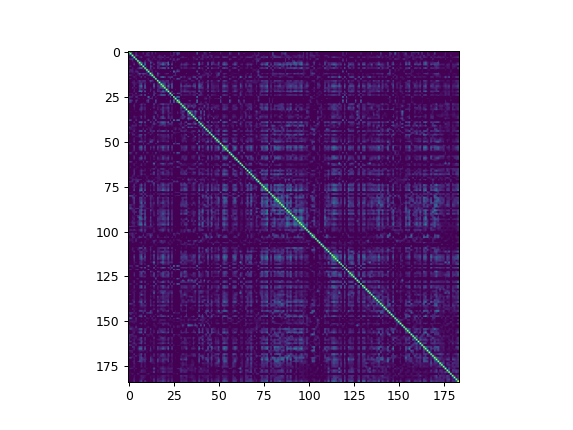

In [151]:
plt.figure()
plt.imshow(trials_cc, clim=[0,1])

In [291]:
trials_111_success['20230112']['frames_start']

array([  3995.,   5028.,   5188.,   5378.,   6823.,   7069.,   7335.,
         7607.,   7981.,   8148.,   8356.,   8546.,   9051.,   9225.,
        20369.,  21153.,  21322.,  21475.,  21657.,  21864.,  23015.,
        24059.,  25158.,  26288.,  29033.,  30053.,  30477.,  37152.,
        37481.,  37988.,  38154.,  38359.,  38688.,  39007.,  39169.,
        39754.,  39948.,  40172.,  41167.,  41351.,  41531.,  41687.,
        41876.,  42140.,  42486.,  42648.,  42832.,  43078.,  43326.,
        43532.,  43707.,  44084.,  44295.,  44636.,  44860.,  45067.,
        45236.,  45854.,  46025.,  46262.,  46443.,  46716.,  55722.,
        56071.,  56562.,  56865.,  57072.,  58106.,  58303.,  58516.,
        58767.,  59016.,  59196.,  59371.,  60775.,  61274.,  61799.,
        62099.,  62616.,  62821.,  64046.,  64356.,  64541.,  64732.,
        64937.,  65283.,  65438.,  65652.,  65887.,  66297.,  67287.,
        67576.,  72163.,  72544.,  78143.,  78721.,  78953.,  79115.,
        79328.,  796

In [170]:
import roicat

In [191]:
np.round(expParams_objs[dates_toUse[1]]['baselineStuff']['ROIs']['cellWeightings']*1000).astype(np.int64).shape

(846,)

In [194]:
roicat_out['ROIs']['ROIs_aligned'][0][iscell].shape

(846, 524288)

In [196]:
len(np.round(expParams_objs[dates_toUse[1]]['baselineStuff']['ROIs']['cellWeightings']*1000).astype(np.int64))

846

In [198]:
FOV_test = roicat.visualization.compute_colored_FOV(
    spatialFootprints=[roicat_out['ROIs']['ROIs_aligned'][0][iscell]],
    FOV_height=roicat_out['ROIs']['frame_height'],
    FOV_width=roicat_out['ROIs']['frame_width'],
    labels=[np.round(expParams_objs[dates_toUse[1]]['baselineStuff']['ROIs']['cellWeightings']*1000).astype(np.int64)],
    cmap=bnpm.plotting_helpers.simple_cmap([[0,0,0],[1,1,1]]),
)

<IPython.core.display.Javascript object>


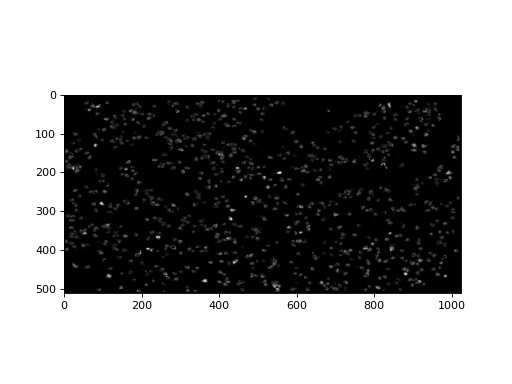

In [201]:
plt.figure()
plt.imshow(FOV_test[0])

In [211]:
mask = expParams_objs[dates_toUse[1]]['baselineStuff']['ROIs']['cellWeightings'][:,None]
hi = roicat_out['ROIs']['ROIs_aligned'][0][iscell].multiply(mask).max(0).toarray().reshape(512, 1024)

<IPython.core.display.Javascript object>


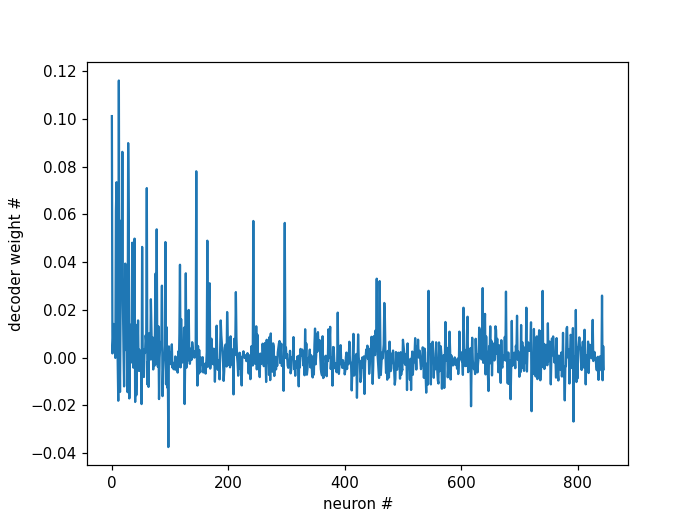

Text(0, 0.5, 'decoder weight #')

In [238]:
plt.figure()
# plt.hist(mask, 200);
plt.plot(mask)
plt.xlabel('neuron #')
plt.ylabel('decoder weight #')

In [212]:
hi.shape

(512, 1024)

<IPython.core.display.Javascript object>


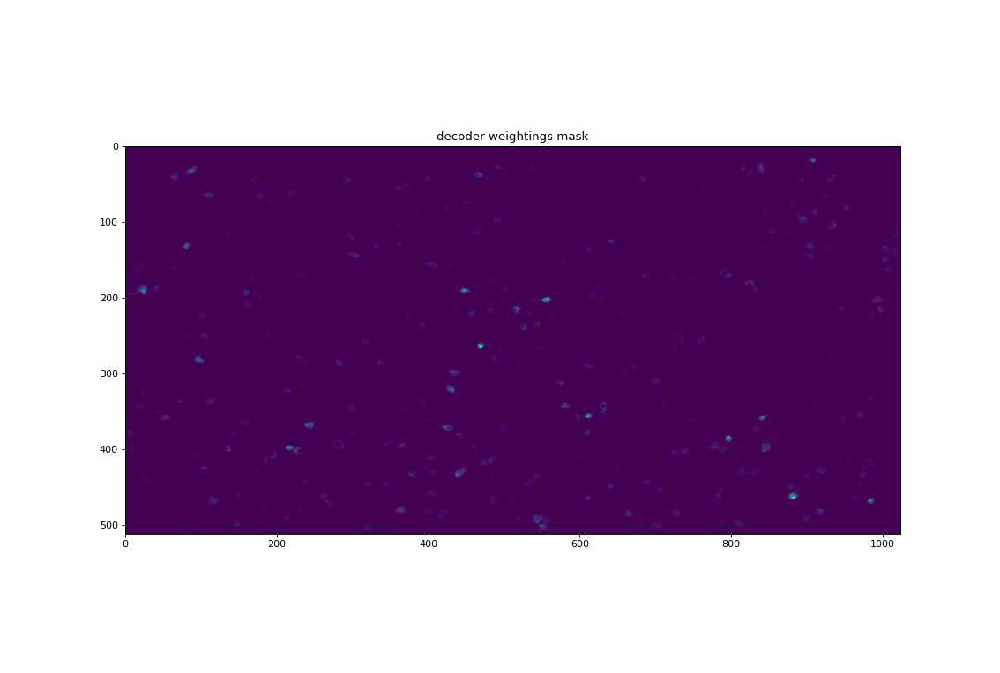

Text(0.5, 1.0, 'decoder weightings mask')

In [214]:
plt.figure()
plt.imshow(hi)
plt.title('decoder weightings mask')

<IPython.core.display.Javascript object>


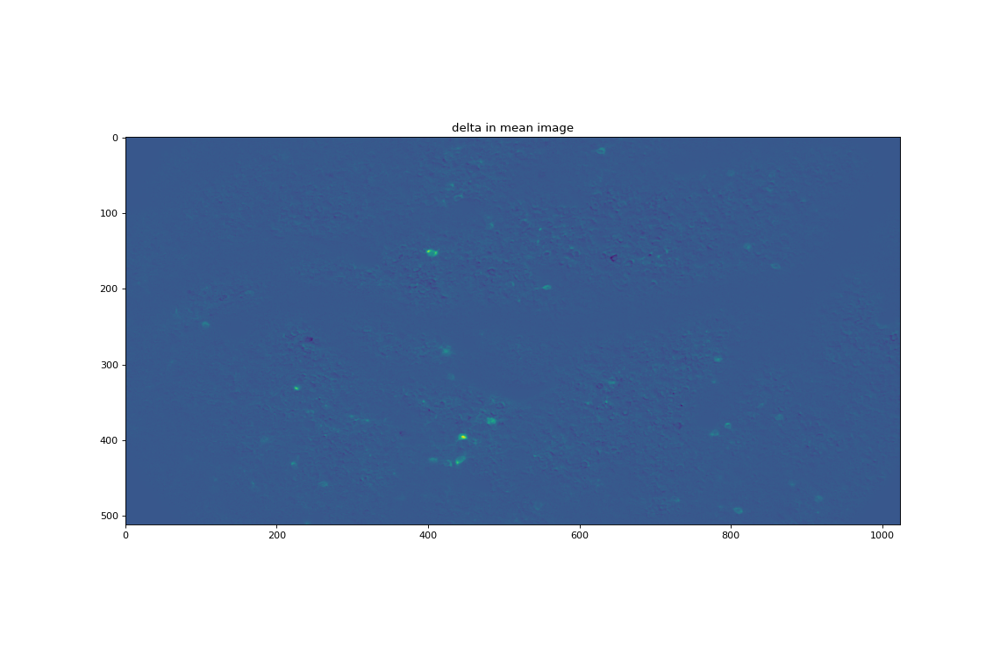

Text(0.5, 1.0, 'delta in mean image')

In [220]:
plt.figure()
plt.imshow(hey3)
plt.title('delta in mean image')

<IPython.core.display.Javascript object>


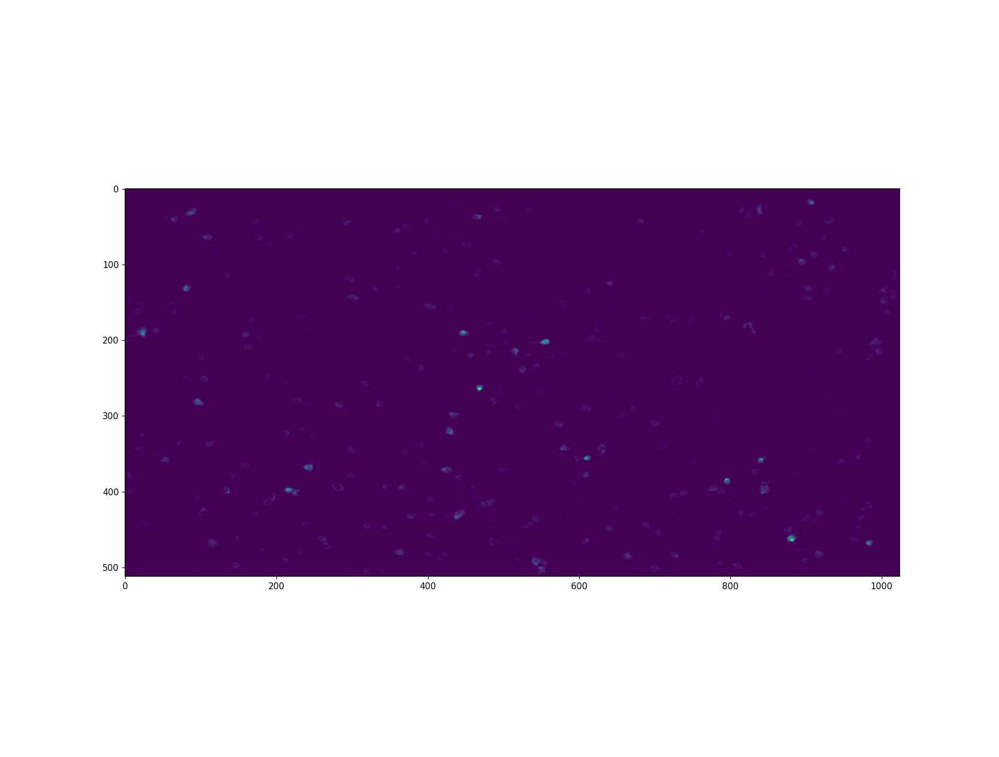

In [228]:
plt.figure()
plt.imshow(bnpm.image_processing.bin_array(hi, bin_widths=[1,1]))

visualize the cells over days

In [301]:
import bnpm.plotting_helpers

In [302]:
import roicat

In [145]:
fovs = roicat.tracking.visualization.compute_colored_FOV(
    spatialFootprints=roicat_out['ROIs']['ROIs_aligned'],
    FOV_height=roicat_out['ROIs']['frame_height'],
    FOV_width=roicat_out['ROIs']['frame_width'],
    labels=roicat_out['UCIDs_bySession'],
)

In [304]:
fovs = roicat.visualization.compute_colored_FOV(
    spatialFootprints=rois_matched,
    FOV_height=roicat_out['ROIs']['frame_height'],
    FOV_width=roicat_out['ROIs']['frame_width'],
    labels=[np.arange(rois_matched[0].shape[0]) for _ in range(len(rois_matched))],
)

<IPython.core.display.Javascript object>


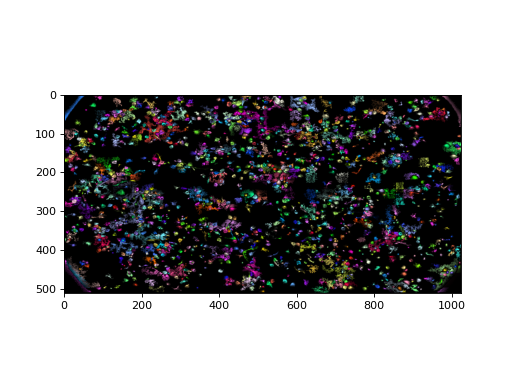

interactive(children=(IntSlider(value=0, description='i_frame', max=8), Output()), _dom_classes=('widget-inter…

In [307]:
%matplotlib notebook

roicat.visualization.display_toggle_image_stack(fovs)

In [44]:
import xxhash

def get_unique_decoders(decoders):
    hashes_unique, idx, inv = np.unique([xxhash.xxh3_64_hexdigest(d) for d in decoders], return_index=True, return_inverse=True)
    idx_argsort = np.argsort(idx)
    decoders_unique_sorted = np.array(decoders)[idx][idx_argsort]
    return decoders_unique_sorted, idx, idx_argsort[inv]

In [45]:
# decoders, idx, inv = get_unique_decoders([expParams_objs[d]['baselineStuff']['ROIs']['cellWeightings'] for d in dates_toUse)
decoders, idx, inv = get_unique_decoders([expParams_objs[d]['baselineStuff']['ROIs']['cellWeightings'] for d in dates_toUse[:-1]])
decoder_dates = {date: i for i,date in zip(inv, dates_toUse)}

In [46]:
decoder_session_divisions = np.concatenate([[np.where(np.array(list(decoder_dates.values())) == d)[0][0] for d in np.unique(list(decoder_dates.values()))], [len(decoder_dates)]])

In [47]:
def get_frames_111_success(logger):
    frames_trialEnds   = logger['trials']['counter_frameNum_trialEnd'].to_numpy()
    frames_trialStarts = logger['trials']['counter_frameNum_trialStart'].to_numpy()

    type_111_success = (logger['trials']['trialType_cursorOn'] * logger['trials']['trialType_feedbackLinked'] * logger['trials']['trialType_rewardOn'] * logger['trials']['success_outcome']).to_numpy()
    framesEnd_111_success = frames_trialEnds[type_111_success[:len(frames_trialEnds)].astype(bool)]
    framesStart_111_success = frames_trialStarts[type_111_success[:len(frames_trialStarts)].astype(bool)]
    
    out = {
        'trialNum': logger['trials']['trialNum_trialStart'],
        'frames_start': framesStart_111_success,
        'frames_end': framesEnd_111_success,
        'duration': logger['trials']['counter_frameNum_trialEnd'] - logger['trials']['counter_frameNum_trialStart'],
    }
    
    return out

trials_111_success = {date: get_frames_111_success(logger) for date, logger in loggerAligned_dfs.items()}

In [51]:
et_traces_start = bnpm.timeSeries.event_triggered_traces(loggerVals_rollZ['20230112'], triggers_start[:], win_bounds=[-10,0], dim=0)[0].mean(-1).astype(np.int16)
et_traces_end   = bnpm.timeSeries.event_triggered_traces(loggerVals_rollZ['20230112'], triggers_end[:], win_bounds=[-10,0], dim=0)[0].mean(-1).astype(np.int16)

/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")


In [101]:
%matplotlib notebook
actVecs = {}
trajs = {}
for date in tqdm(dates_toUse[:]):
    triggers_start = trials_111_success[date]['frames_start']
    triggers_end = trials_111_success[date]['frames_end']
    
    arr = loggerVals_rollZ[date]
#     arr = sp_matched[date]
#     arr = sp_raw[date]
#     arr = F_matched[date]
#     arr = dFoF_matched[date]
#     arr = arr[np.argsort(decoders[idx_decoder_toUse])[::-1]]

    et_traces_start, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
        arr=arr,
        idx_triggers=triggers_start,
        win_bounds=[-0,1],
        dim=-1,
    )
    et_traces_end, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
        arr=arr,
        idx_triggers=triggers_end,
        win_bounds=[-0,1],
        dim=-1,
    )

#     et_traces[np.abs(et_traces) > 5] = np.nan
    
#     et_traces = np.nan_to_num(et_traces)
    
    mean_start   = np.nanmean(et_traces_start, axis=2)
    mean_end   = np.nanmean(et_traces_end, axis=2)
    
    actVecs.update({date: mean_end})
    
    
#     out_mean = out_mean[np.argsort(decoders[idx_decoder_toUse])[::-1]]
    
#     actVecs.update({date: out_mean})
    
#     plt.figure()
# #     plt.imshow(np.nan_to_num(et_traces).mean(1), clim=[-0.02,0.06], aspect='auto', extent=(xAxis[0], xAxis[-1], mean_traces_sorted.shape[0], 0))
#     plt.imshow(
#         out_mean.T, 
#         clim=[-0.02,2.15],
#         aspect='auto', 
# #         extent=(xAxis[0], xAxis[-1], out_mean.shape[0], 0)
#     )
# #     plt.plot([0,0], [0, out_mean.shape[0]], 'r')
# #     break

  0%|                                                     | 0/8 [00:00<?, ?it/s]/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
100%|████████████████████████████████████████████| 8/8 [00:00<00:00, 185.70it/s]


In [102]:
et_traces.shape

(846, 237, 480)

In [103]:
mean_start.shape

(846, 237)

In [104]:
decoders[0].shape

(846,)

<IPython.core.display.Javascript object>


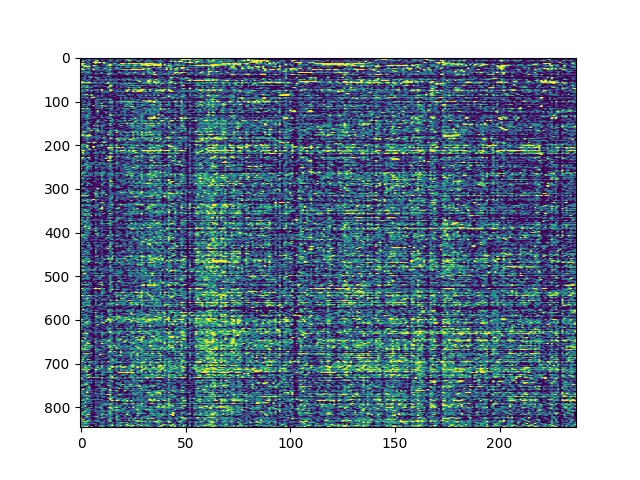

In [105]:
plt.figure()
plt.imshow(mean_end, aspect='auto', clim=[0,2])

In [109]:
mean_end_dec = {date: a * decoders[0][:,None] for date,a in actVecs.items()}
[print(f'{mean_end_dec.shape = }') for mean_end_dec in mean_end_dec.values()];

mean_end_dec.shape = (846, 128)
mean_end_dec.shape = (846, 196)
mean_end_dec.shape = (846, 195)
mean_end_dec.shape = (846, 186)
mean_end_dec.shape = (846, 174)
mean_end_dec.shape = (846, 207)
mean_end_dec.shape = (846, 222)
mean_end_dec.shape = (846, 237)


In [115]:
mean_end_dec_norm = {date: m / np.nansum(m, axis=0) for date,m in mean_end_dec.items()}

<IPython.core.display.Javascript object>


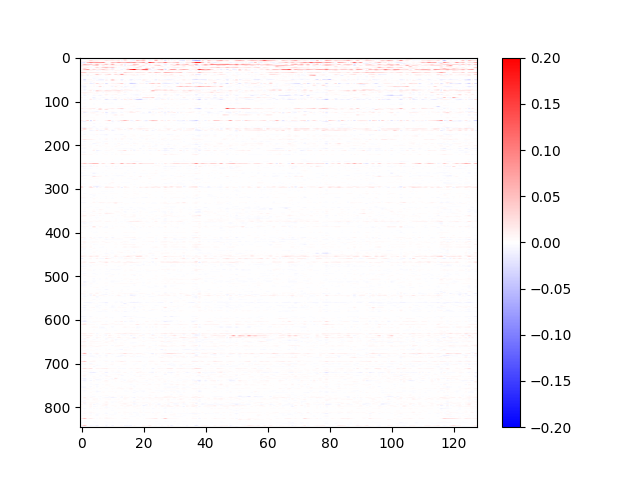

In [117]:
plt.figure()
plt.imshow(mean_end_dec_norm[dates_toUse[0]], aspect='auto', clim=[-0.2,0.2], cmap='bwr')
plt.colorbar()

<IPython.core.display.Javascript object>


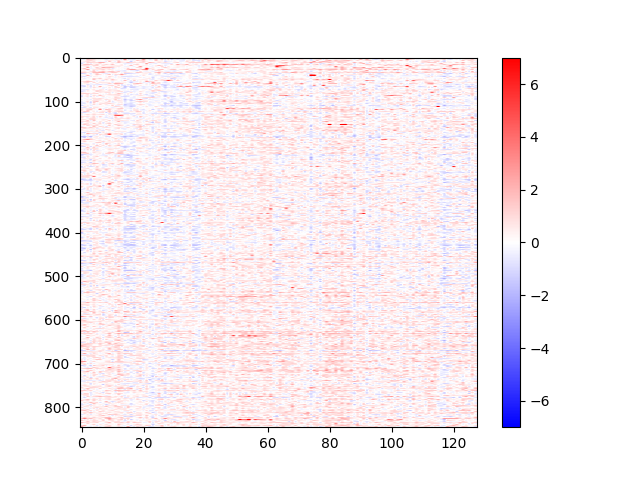

In [120]:
plt.figure()
plt.imshow(actVecs[dates_toUse[0]], aspect='auto', clim=[-7,7], cmap='bwr')
plt.colorbar()

Is the activity vector more closely aligned with modulating the average or the decoder?
decoder vs average
activity vs decoder
activity vs average

In [65]:
import sklearn

In [66]:
comps_pca, scores_pca, singVals, EVR = bnpm.decomposition.torch_pca(mean_end_dec_norm.T, rank=None, device='cpu', mean_sub=True, zscore=False, return_numpy=True)

In [67]:
comps_pca.shape

(846, 237)

In [68]:
decoders[0].shape

(846,)

<IPython.core.display.Javascript object>


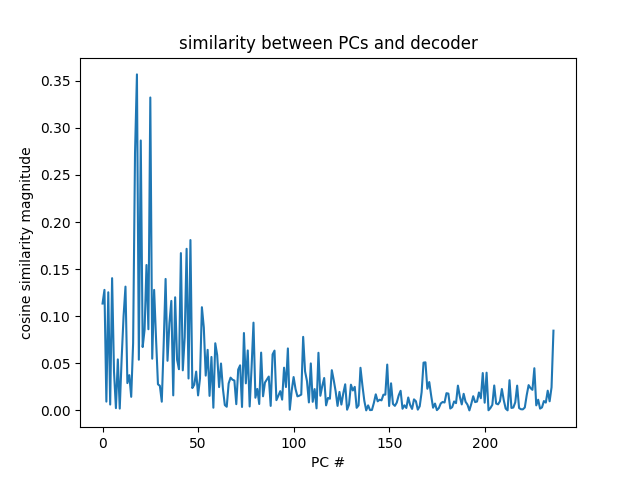

Text(0.5, 1.0, 'similarity between PCs and decoder')

In [69]:
comps_pca_decSim = sklearn.metrics.pairwise.cosine_similarity(comps_pca.T, decoders[0][None,:])

%matplotlib notebook
plt.figure()
plt.plot(np.abs(comps_pca_decSim))
plt.xlabel('PC #')
plt.ylabel('cosine similarity magnitude')
plt.title('similarity between PCs and decoder')
# plt.xlim([-0.5, 6])

In [71]:
import tensorly as tl

In [147]:
cps = {date: tl.decomposition.CP(
    rank=7,
    n_iter_max=100,
    init='svd',
    svd='truncated_svd',
    normalize_factors=False,
    orthogonalise=False,
    tol=1e-9,
    random_state=None,
    verbose=2,
    sparsity=None,
    l2_reg=0,
    mask=None,
    cvg_criterion='abs_rec_error',
    fixed_modes=None,
    svd_mask_repeats=5,
    linesearch=False,
    callback=None,
) for date in dates_toUse}
factors_cp = {date: cp.fit_transform(tensor=mean_end_dec_norm[date]) for date,cp in cps.items()}
comps_cp = {date: f.factors[0] for date,f in factors_cp.items()}
scores_cp = {date: f.factors[1] for date,f in factors_cp.items()}

Starting iteration 1
Mode 0 of 2
Mode 1 of 2
reconstruction error=0.5573248396776092
Starting iteration 2
Mode 0 of 2
Mode 1 of 2
iteration 1, reconstruction error: 0.557324938882719, decrease = -9.920510979366526e-08, unnormalized = 1.9954384988040579
Starting iteration 3
Mode 0 of 2
Mode 1 of 2
iteration 2, reconstruction error: 0.557324938882719, decrease = 0.0, unnormalized = 1.9954384988040579
PARAFAC converged after 2 iterations
Starting iteration 1
Mode 0 of 2
Mode 1 of 2
reconstruction error=0.5550130555021624
Starting iteration 2
Mode 0 of 2
Mode 1 of 2
iteration 1, reconstruction error: 0.5550130555021624, decrease = 0.0, unnormalized = 2.3361603714112773
PARAFAC converged after 1 iterations
Starting iteration 1
Mode 0 of 2
Mode 1 of 2
reconstruction error=0.5662404237320606
Starting iteration 2
Mode 0 of 2
Mode 1 of 2
iteration 1, reconstruction error: 0.5662404237320606, decrease = 0.0, unnormalized = 2.49749386844968
PARAFAC converged after 1 iterations
Starting iteration 

In [122]:
tensors_by_rank = {date: [tl.tenalg.outer(k) for k in bnpm.indexing.cp_to_kruskal(f.factors)] for date,f in factors_cp.items()}

In [123]:
def tensor_EVR(y_pred, y_true):
    return 1 - ( tl.norm(y_true - y_pred, order=2) / tl.norm(y_true, order=2) )

In [129]:
EVRs = {date: [tensor_EVR(y_pred=t, y_true=mean_end_dec_norm[date]) for t in tbr] for date,tbr in tensors_by_rank.items()}

<IPython.core.display.Javascript object>


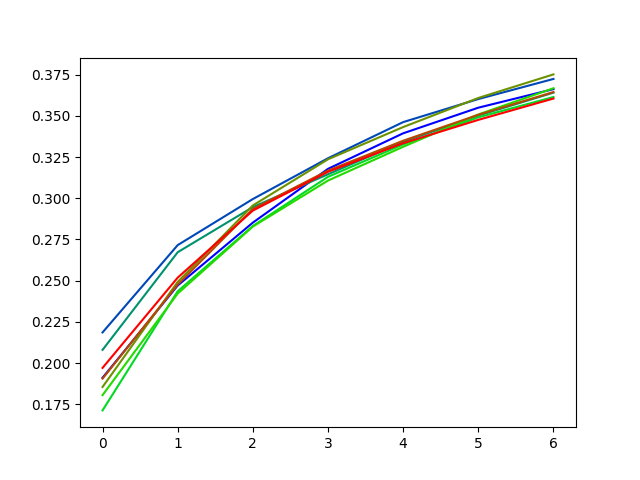

In [136]:
colors = bnpm.plotting_helpers.simple_cmap([[0,0,1],[0,1,0],[1,0,0]])(np.linspace(0.,1., len(EVRs)))
plt.figure()
[plt.plot(np.cumsum(e), c=c) for e,c in zip(EVRs.values(), colors)];

<IPython.core.display.Javascript object>


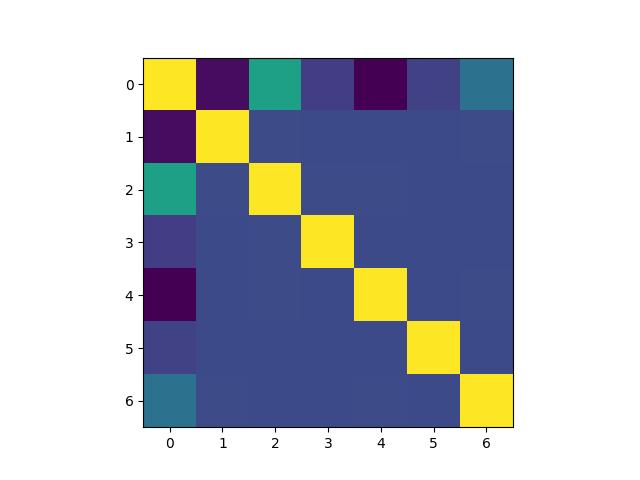

In [135]:
plt.figure()
plt.imshow(np.corrcoef(scores_cp.T))

In [826]:
import sklearn

nmf = sklearn.decomposition.NMF(
    n_components=7,
    init=None,
    solver='cd',
    beta_loss='frobenius',
    tol=0.0001,
    max_iter=200,
    random_state=None,
    alpha_W=0.0,
    alpha_H='same',
    l1_ratio=0.0,
    verbose=1,
    shuffle=False,
)
comps_nmf = nmf.fit_transform(X=mean_end_dec_norm)

ValueError: Negative values in data passed to NMF (input X)

In [ ]:
import sklearn

fa = sklearn.decomposition.FactorAnalysis(
    n_components=7,
    tol=0.01,
    copy=True,
    max_iter=1000,
    noise_variance_init=None,
    svd_method='randomized',
    iterated_power=3,
    rotation=None,
    random_state=0,
)
scores_fa = fa.fit_transform(X=mean_end_dec_norm.T)

In [ ]:
import sklearn

kpca = sklearn.decomposition.KernelPCA(
    n_components=7,
    kernel='rbf',
    gamma=None,
    degree=3,
    coef0=1,
    kernel_params=None,
    alpha=1.0,
    fit_inverse_transform=False,
    eigen_solver='auto',
    tol=0,
    max_iter=None,
    iterated_power='auto',
    remove_zero_eig=False,
    random_state=None,
    copy_X=True,
    n_jobs=None,
)
scores_kpca = kpca.fit_transform(X=mean_end_dec_norm.T)

In [ ]:
import sklearn

spca = sklearn.decomposition.SparsePCA(
    n_components=4,
    alpha=0.5,
    ridge_alpha=0.01,
    max_iter=1000,
    tol=1e-08,
    method='lars',
    n_jobs=None,
    U_init=None,
    V_init=None,
    verbose=False,
    random_state=None,
)
scores_spca = spca.fit_transform(X=mean_end_dec_norm.T)

In [ ]:
import umap

umap_obj = umap.UMAP(
    n_neighbors=10,
    n_components=2,
    metric='euclidean',
    metric_kwds=None,
    output_metric='euclidean',
    output_metric_kwds=None,
    n_epochs=None,
    learning_rate=1.0,
    init='spectral',
    min_dist=0.1,
    spread=1.0,
    low_memory=True,
    n_jobs=-1,
    set_op_mix_ratio=1.0,
    local_connectivity=1.0,
    repulsion_strength=1.0,
    negative_sample_rate=5,
    transform_queue_size=4.0,
    a=None,
    b=None,
    random_state=None,
    angular_rp_forest=False,
    target_n_neighbors=-1,
    target_metric='categorical',
    target_metric_kwds=None,
    target_weight=0.5,
    transform_seed=42,
    transform_mode='embedding',
    force_approximation_algorithm=False,
    verbose=False,
    tqdm_kwds=None,
    unique=False,
    densmap=False,
    dens_lambda=2.0,
    dens_frac=0.3,
    dens_var_shift=0.1,
    output_dens=False,
    disconnection_distance=None,
    precomputed_knn=(None, None, None),
)

scores_umap = umap_obj.fit_transform(X=mean_end_dec_norm.T)

In [ ]:
scores_umap.shape

<IPython.core.display.Javascript object>


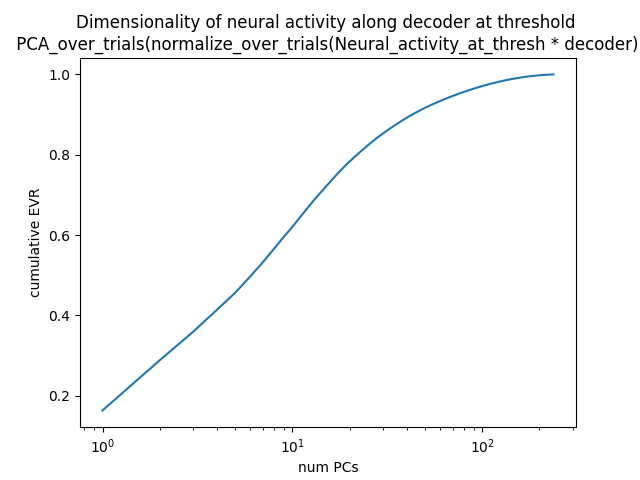

In [827]:
plt.figure()
plt.plot(np.arange(1, len(EVR)+1), np.cumsum(EVR))
plt.xscale('log')
plt.xlabel('num PCs')
plt.ylabel('cumulative EVR')
plt.title('Dimensionality of neural activity along decoder at threshold \n PCA_over_trials(normalize_over_trials(Neural_activity_at_thresh * decoder))');

In [283]:
import itertools

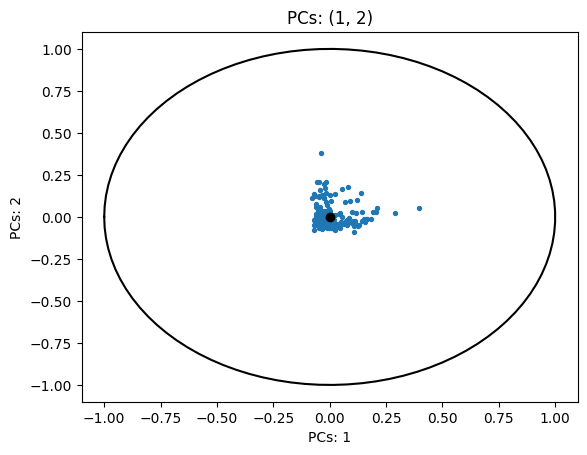

In [160]:
scores = scores_cp[dates_toUse[7]].copy()

%matplotlib inline
for combo in list(itertools.combinations((1,2), 2)):
    plt.figure()
    plt.scatter(scores[:,combo[0]], scores[:,combo[1]], s=8)
    plt.title(f'PCs: {combo}')
    plt.xlabel(f'PCs: {combo[0]}')
    plt.ylabel(f'PCs: {combo[1]}')    
    plt.plot(np.cos(np.linspace(-np.pi, np.pi, num=100)), np.sin(np.linspace(-np.pi, np.pi, num=100)), 'k')
    plt.scatter([0],[0], c='k')

### Save results

Make a nice little dictionary with all the relevant information

In [33]:
name_animal = 'mouse_2_6'

In [63]:
data_output = {
    'name_animal': name_animal,
    'paths_logger': paths_logger,
    'paths_expParams': paths_expParams,
    'dirs_logger': dirs_logger,
    'paths_transfer': paths_transfer,
#     'logger_objs': logger_objs,
#     'expParams_objs': expParams_objs,
#     'logger_dfs': logger_dfs,
    'n_sessions': n_sessions,
    'trials_duration_nowTime': trials_duration_nowTime,
    'trials_success': trials_success,
    'trials_type_111': trials_type_111,
    'trials_numSuccess__111': trials_numSuccess__111,
    'trials_duration_time__success_111': trials_duration_time__success_111,
    'edges': edges,
    'trials_durationHist_time__success_111': trials_durationHist_time__success_111,
    'names_states': names_states,
}

save the analysis outputs and the logger and expParams objects

In [68]:
bnpm.file_helpers.pickle_save(
    obj=data_output,
    path_save=str(Path(r'/media/rich/bigSSD/analysis_data/BMI/analysis_BMI_rewards').resolve() / name_animal / (name_animal + '__analysis_BMI_rewards' + '.pkl')),
    mkdir=True,
)

bnpm.file_helpers.pickle_save(
    obj={
        'logger_dfs': logger_dfs,
        'logger_objs': logger_objs,
        'expParams_objs': expParams_objs,
    },
    path_save=str(Path(r'/media/rich/bigSSD/analysis_data/BMI/analysis_BMI_rewards').resolve() / name_animal / (name_animal + '__logger_expParams' + '.pkl')),
    mkdir=True
)